In [1]:
import pandas as pd
import numpy as np
import pyaf.ForecastEngine as autof
import sys, datetime

%matplotlib inline  
import matplotlib.pyplot as plt

In [2]:
lTimeVar, lSignalVar = "Time", "Temperature"

def get_dataset():
    # thanks to facebook/prophet.
    # Temperature every 5 minutes from 2017-05-01 00:00:00 to 2017-07-05 00:00:00
    # 18722 observations
    # Missing data around : 11689 2017-06-10 14:05:00          NaN

    uri = "https://raw.githubusercontent.com/facebook/prophet/main/examples/example_yosemite_temps.csv"
    df = pd.read_csv(uri)
    df.columns = [lTimeVar, lSignalVar]
    df[lTimeVar] = df[lTimeVar].apply(datetime.datetime.fromisoformat)
    N = df.shape[0];
    print(df.head())
    print(df[df.Temperature.isnull()].head())
    print(df.info())
    print(df.describe())
    sys.stdout.flush()
    K = 1000
    df_train = df[0:N-K]

    return  df_train



In [3]:
def buildModel(H):

    lEngine = autof.cForecastEngine()
    lEngine

    # lEngine.mOptions.enable_slow_mode();
    # lEngine.mOptions.mDebug = True;
    # lEngine.mOptions.mDebugPerformance = True;
    lEngine.mOptions.mParallelMode = True
    lEngine.mOptions.mMissingDataOptions.mSignalMissingDataImputation = "PreviousValue"
    
    lEngine.train(df_train , lTimeVar , lSignalVar, H);
    lEngine.getModelInfo();
        
    lEngine.standardPlots();
    plt.show()
    print("\n\n<ModelInfo>")
    print(lEngine.to_json());
    print("</ModelInfo>\n\n")
    return lEngine

In [4]:
def apply_and_plot_model(iEngine, df_train, H):
    dfapp_in = df_train.copy();
    dfapp_in.tail()
    
    #H = 12
    dfapp_out = iEngine.forecast(dfapp_in, H);
    #dfapp_out.to_csv("outputs/ozone_apply_out.csv")
    print("Forecast Columns " , dfapp_out.columns);
    dfapp_out.plot.line(lTimeVar, [lSignalVar , lSignalVar + '_Forecast', 
                                   lSignalVar + '_Forecast_Lower_Bound', 
                                   lSignalVar + '_Forecast_Upper_Bound'], grid = True, figsize=(12, 8))
    plt.show()
    
    Forecast_DF = dfapp_out[[lTimeVar , lSignalVar, lSignalVar + '_Forecast', lSignalVar + '_Forecast_Lower_Bound', lSignalVar + '_Forecast_Upper_Bound']]
    print(Forecast_DF.info())
    print("Forecasts\n" , Forecast_DF.tail(H));




In [5]:
df_train = get_dataset()
    
def build_forecast_and_plot_model(iHorizon):
    lEngine_H = buildModel(iHorizon)
    apply_and_plot_model(lEngine_H, df_train, iHorizon)
    return lEngine_H

                 Time  Temperature
0 2017-05-01 00:00:00         27.8
1 2017-05-01 00:05:00         27.0
2 2017-05-01 00:10:00         26.8
3 2017-05-01 00:15:00         26.5
4 2017-05-01 00:20:00         25.6
                     Time  Temperature
11689 2017-06-10 14:05:00          NaN
11690 2017-06-10 14:10:00          NaN
11691 2017-06-10 14:15:00          NaN
11692 2017-06-10 14:20:00          NaN
11693 2017-06-10 14:25:00          NaN
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18721 entries, 0 to 18720
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time         18721 non-null  datetime64[ns]
 1   Temperature  18709 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 292.6 KB
None
        Temperature
count  18709.000000
mean      18.449409
std       13.888552
min       -8.400000
25%        8.000000
50%       13.800000
75%       27.900000
max       53.200000


INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 4}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 4, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 4, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 4, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 4, 'Transformation': 'RelDif

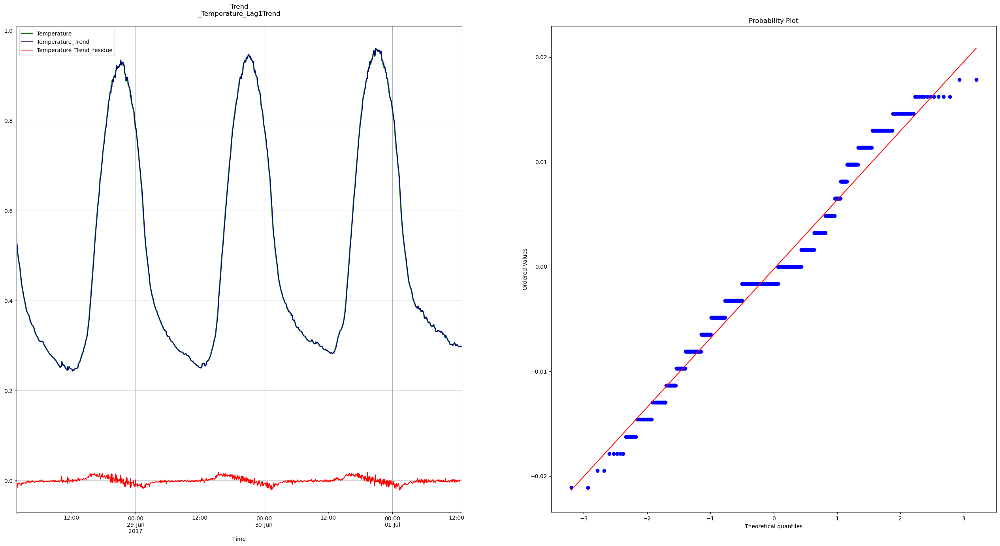

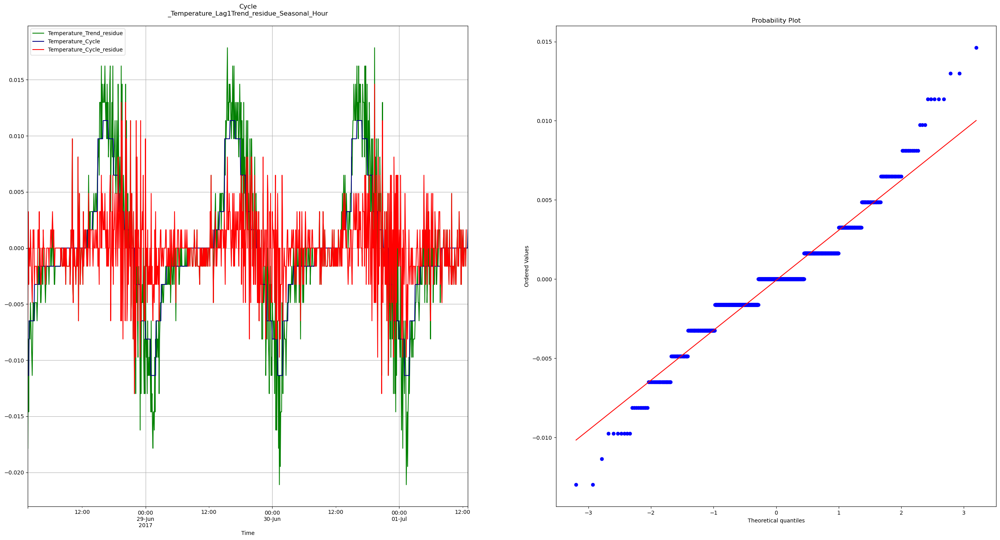

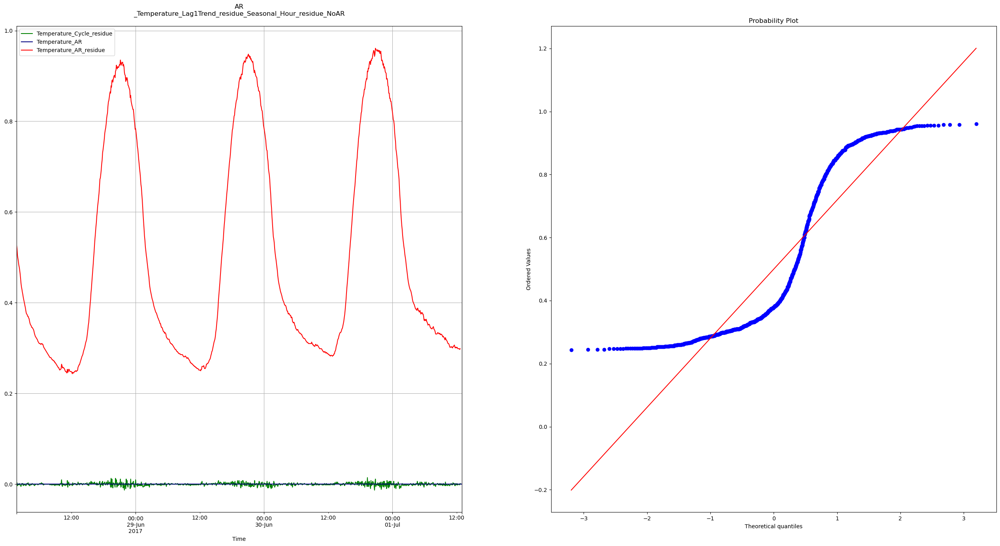

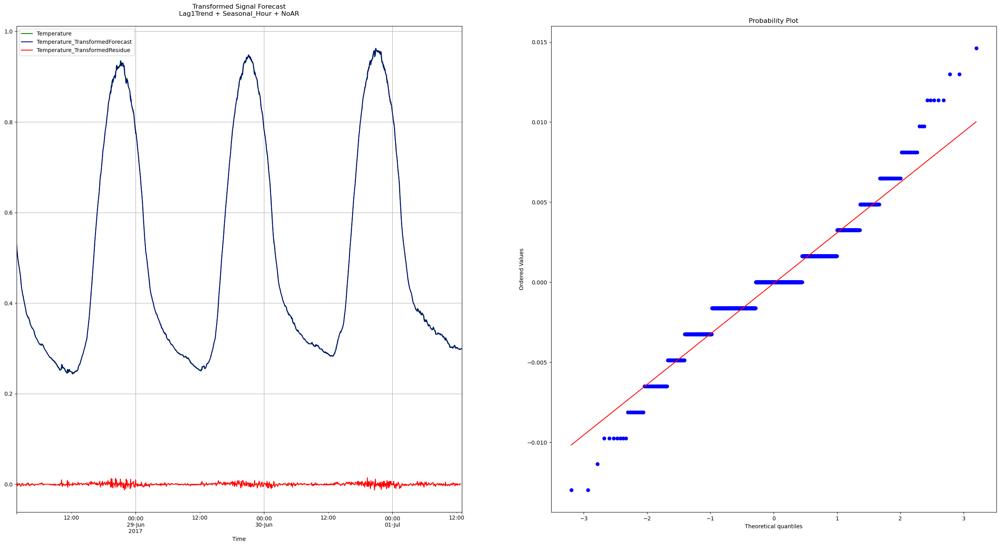

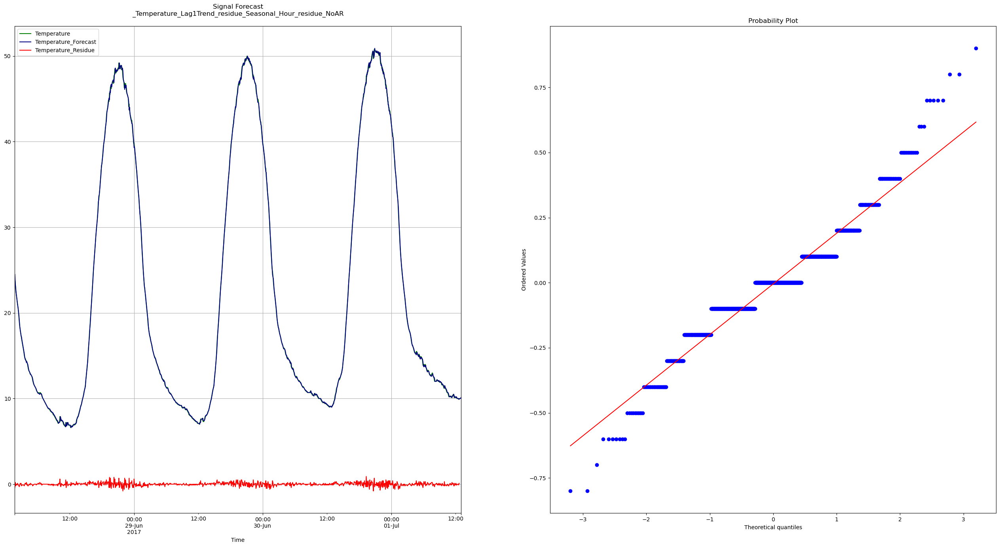

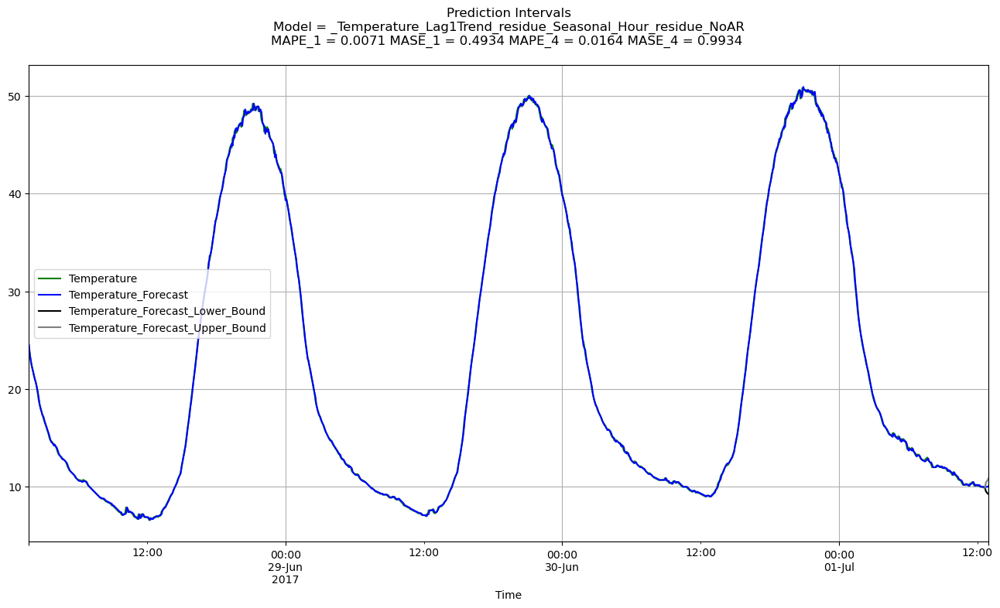

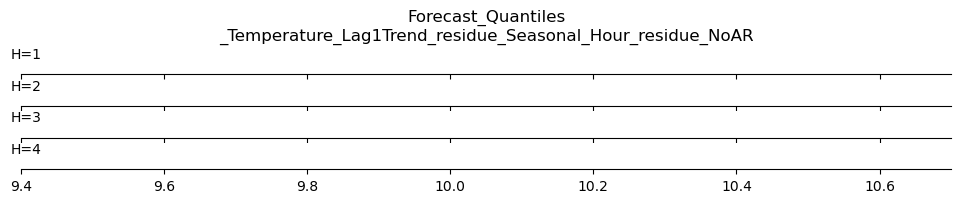

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 4}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 4,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4993,
  

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.204, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 4}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

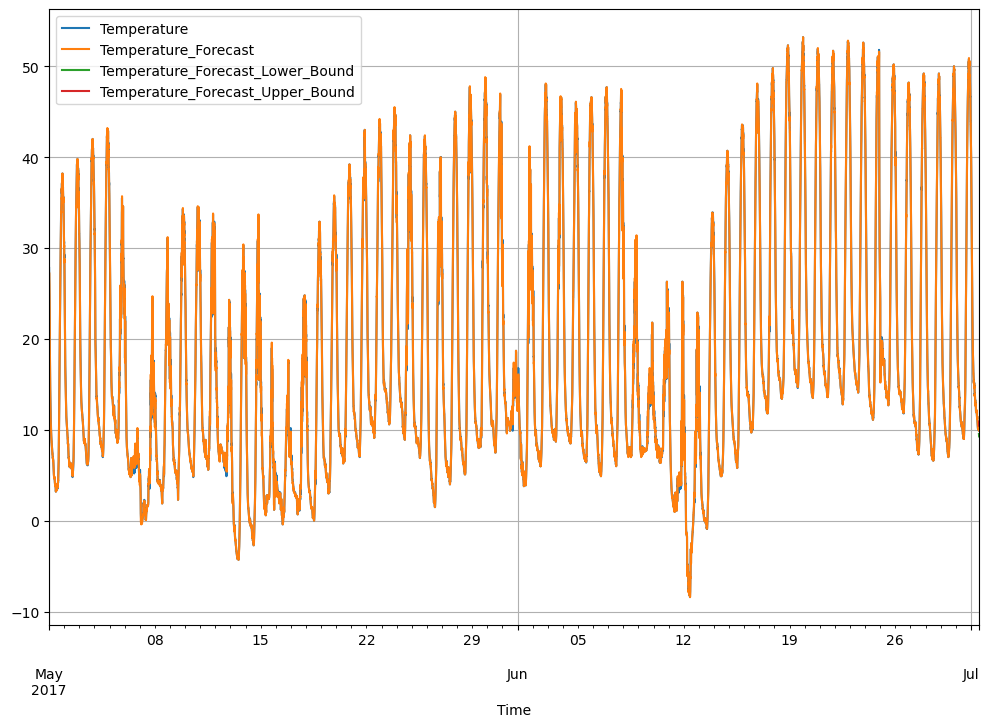

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 8}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17725 entries, 0 to 17724
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17725 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17725 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  4 non-null      float64       
 4   Temperature_Forecast_Upper_Bound  4 non-null      float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 692.5 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   

    

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 4.363, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 4.389, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 8, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.

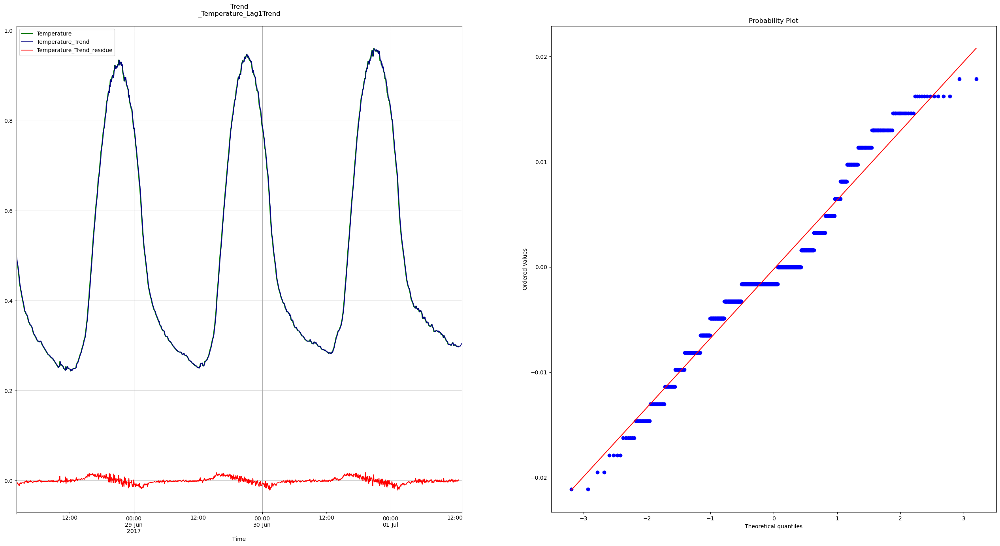

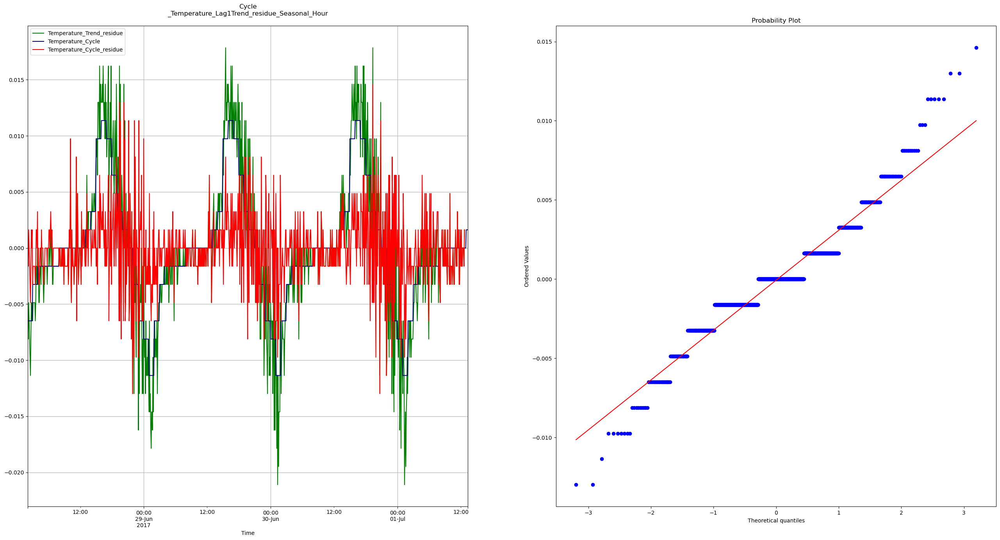

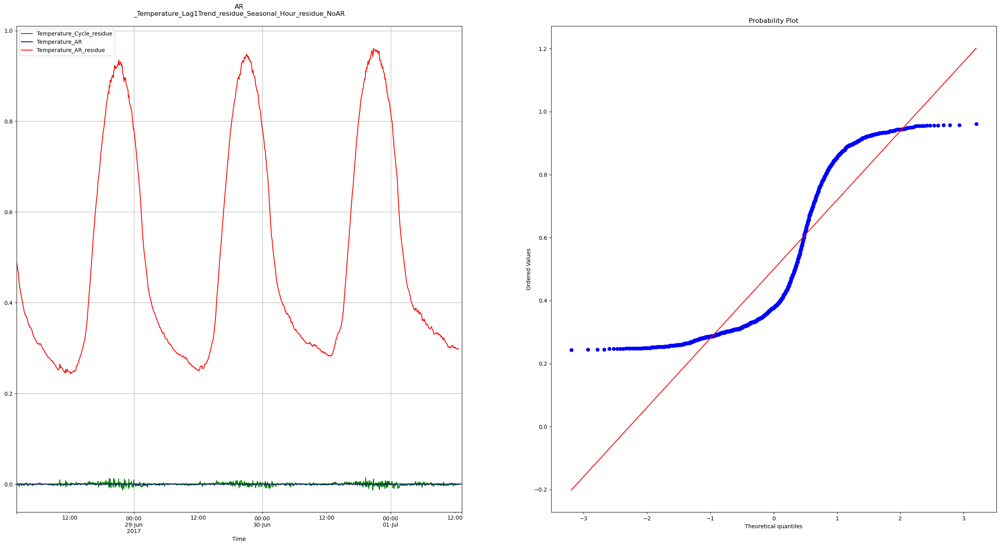

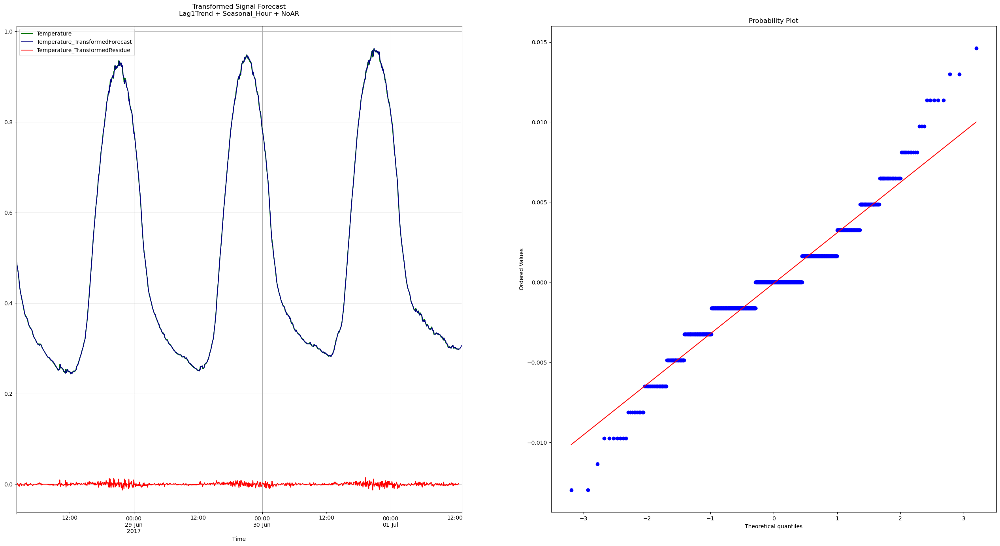

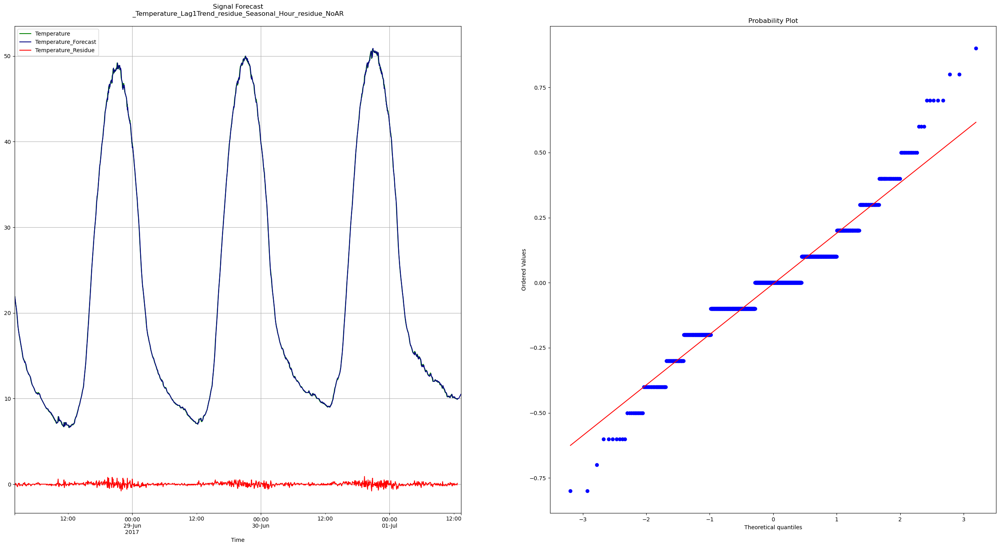

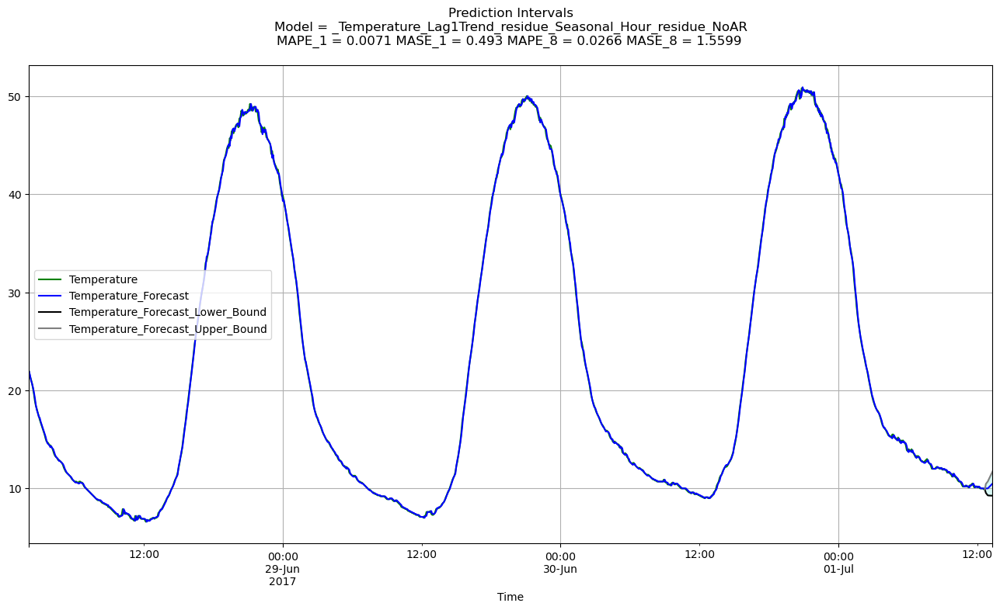

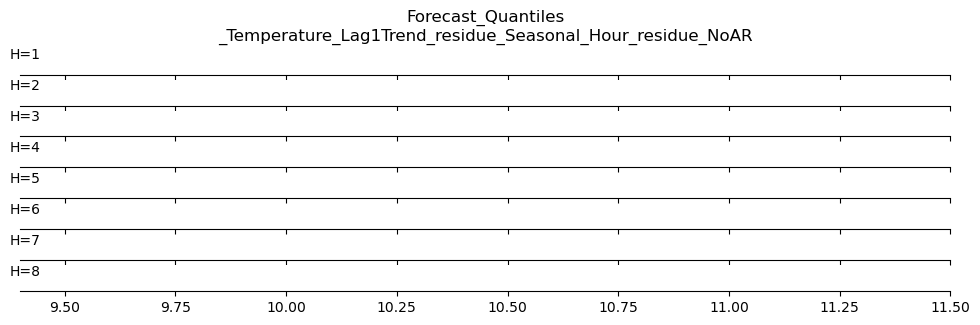

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 8}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 8,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4993,
  

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.242, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 8}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

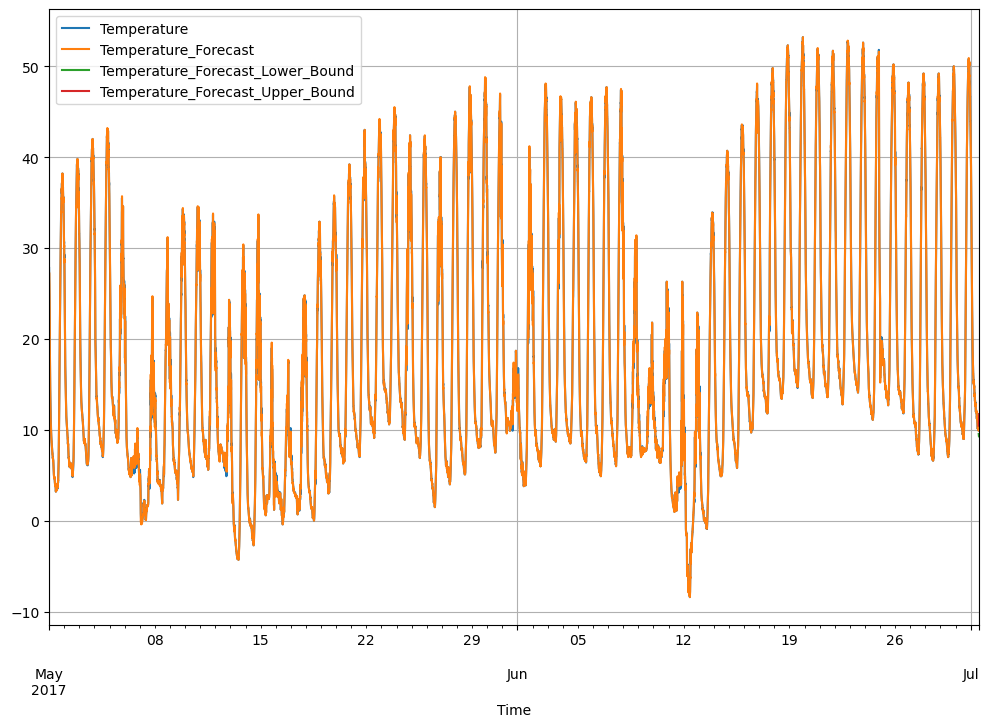

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 16}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17729 entries, 0 to 17728
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17729 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17729 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  8 non-null      float64       
 4   Temperature_Forecast_Upper_Bound  8 non-null      float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 692.7 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 5.751, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 5.776, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 16, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO

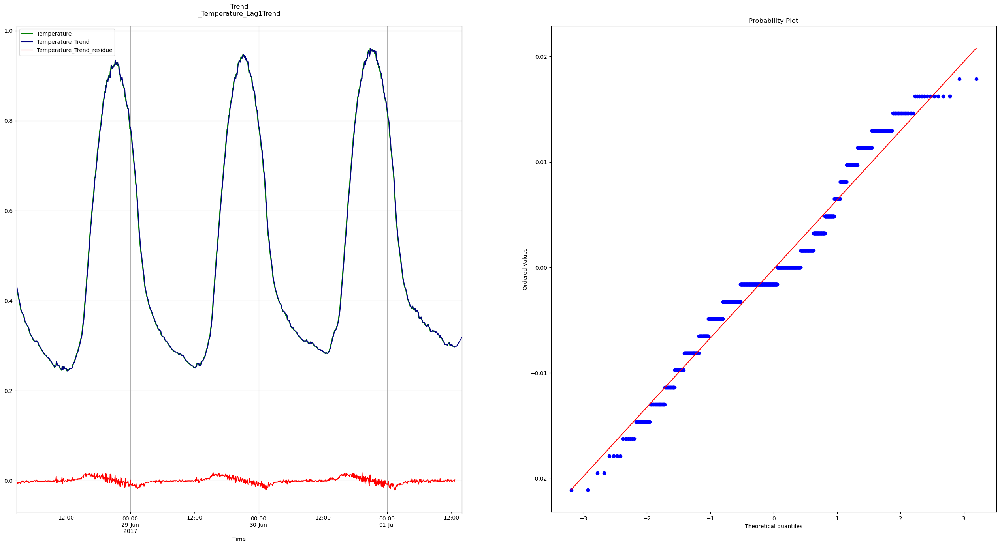

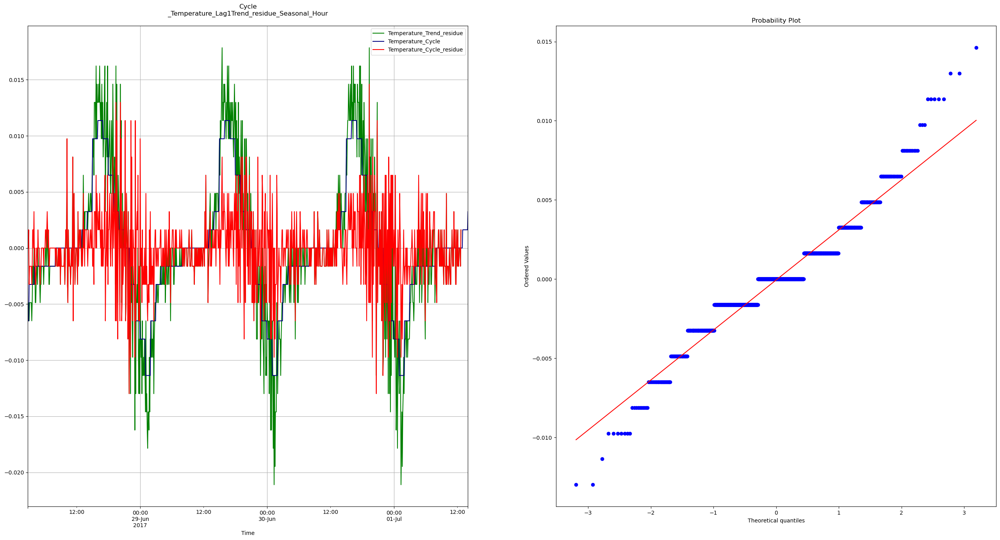

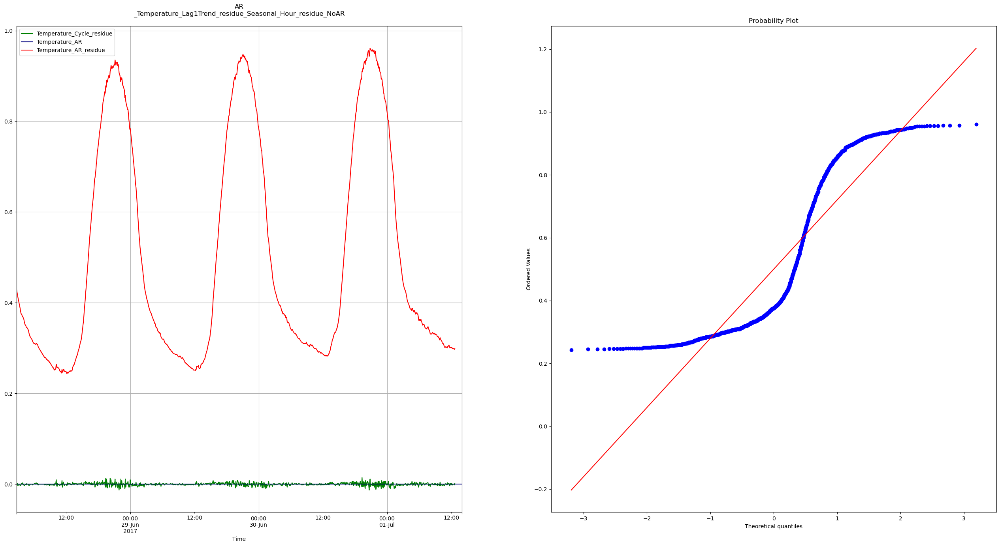

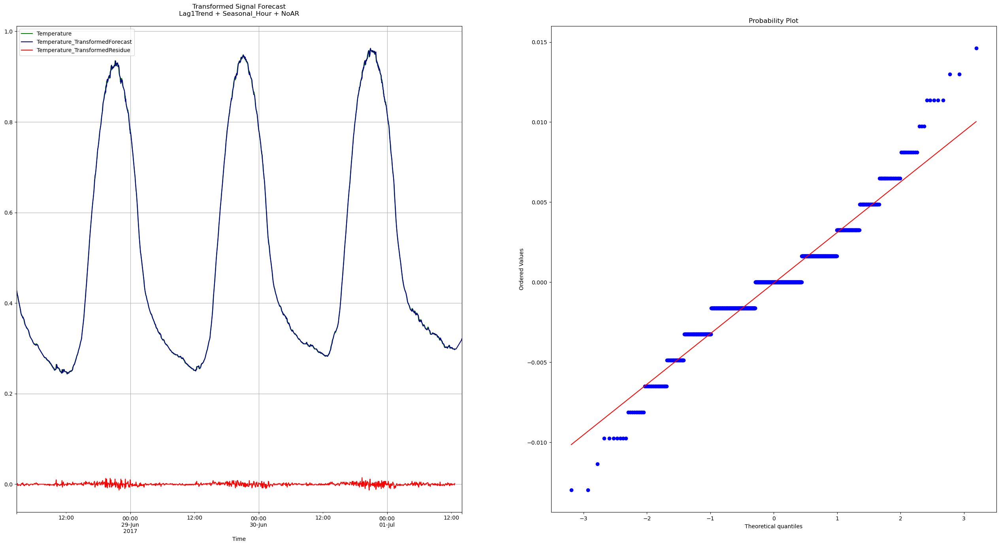

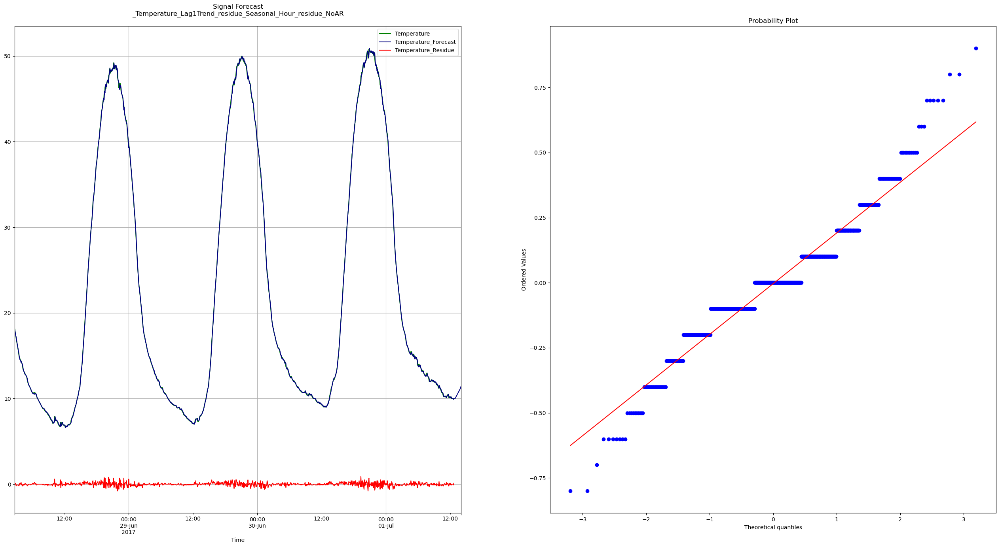

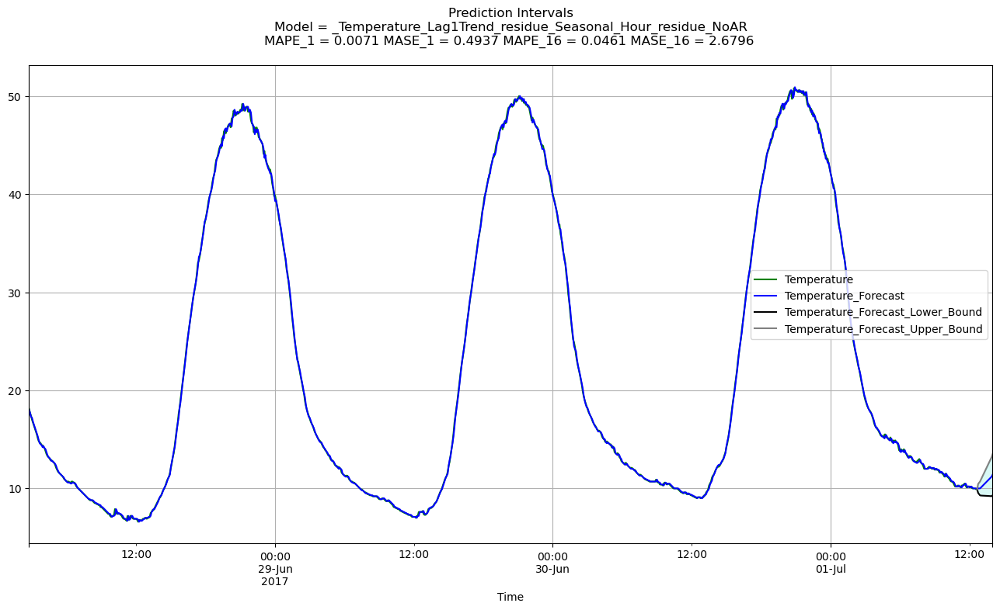

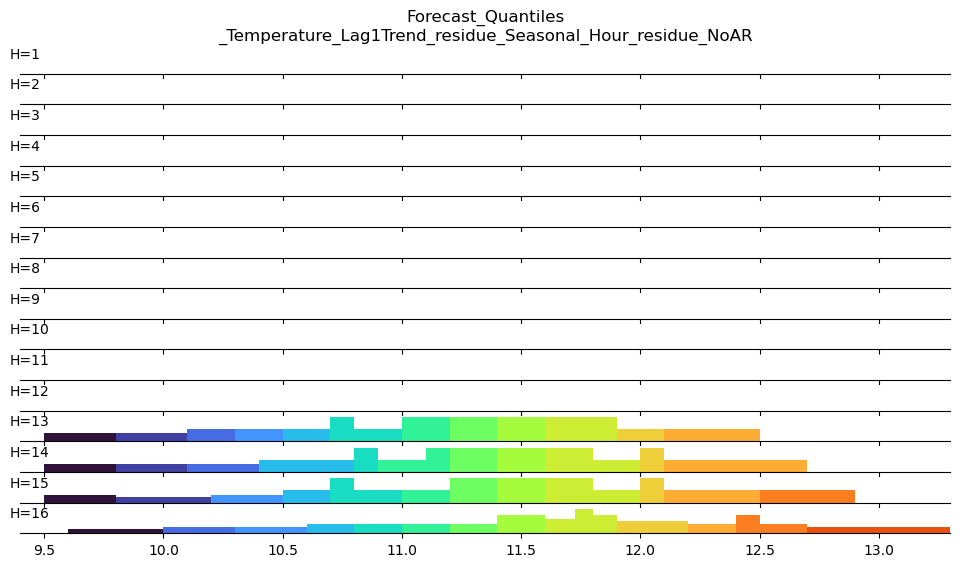

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 16}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 16,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4993,
 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.388, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 16}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

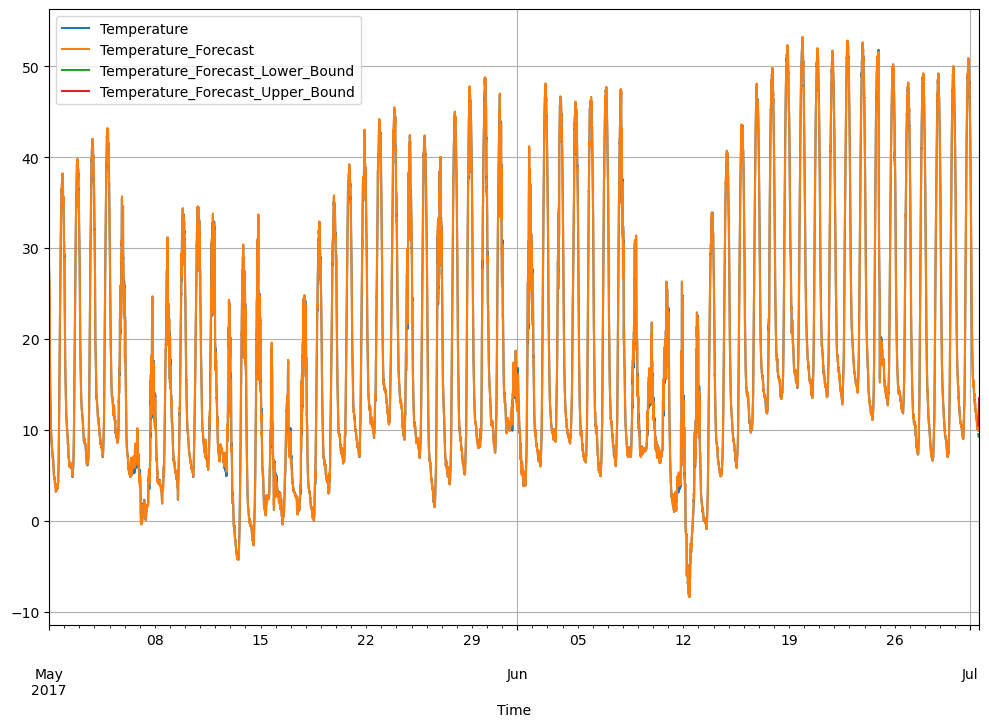

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 32}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17737 entries, 0 to 17736
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17737 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17737 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  16 non-null     float64       
 4   Temperature_Forecast_Upper_Bound  16 non-null     float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 693.0 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 8.332, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 8.685, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 32, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO

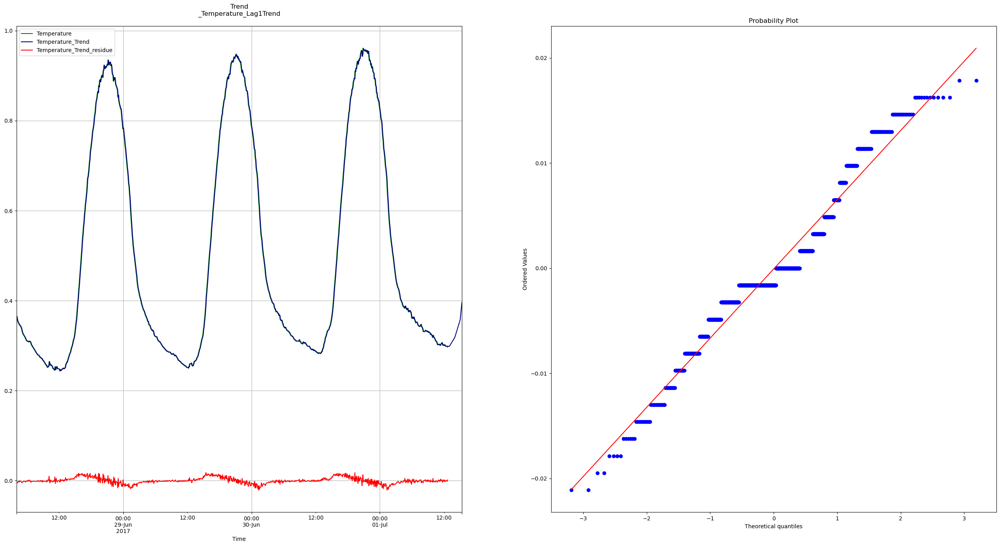

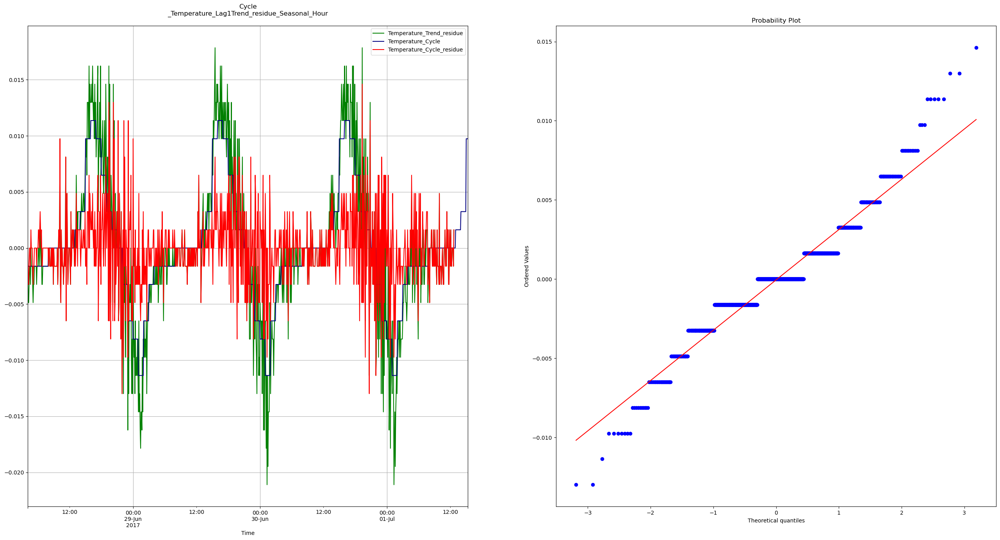

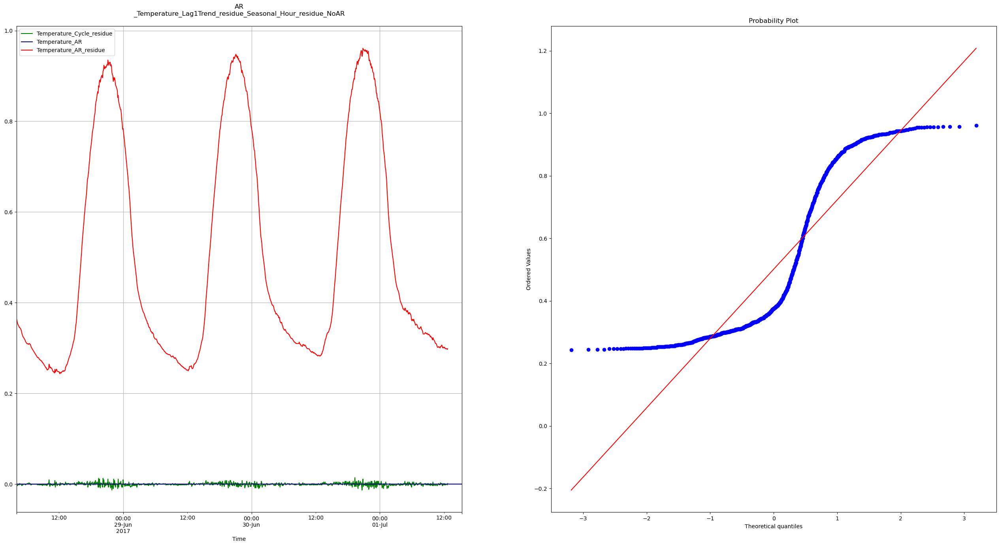

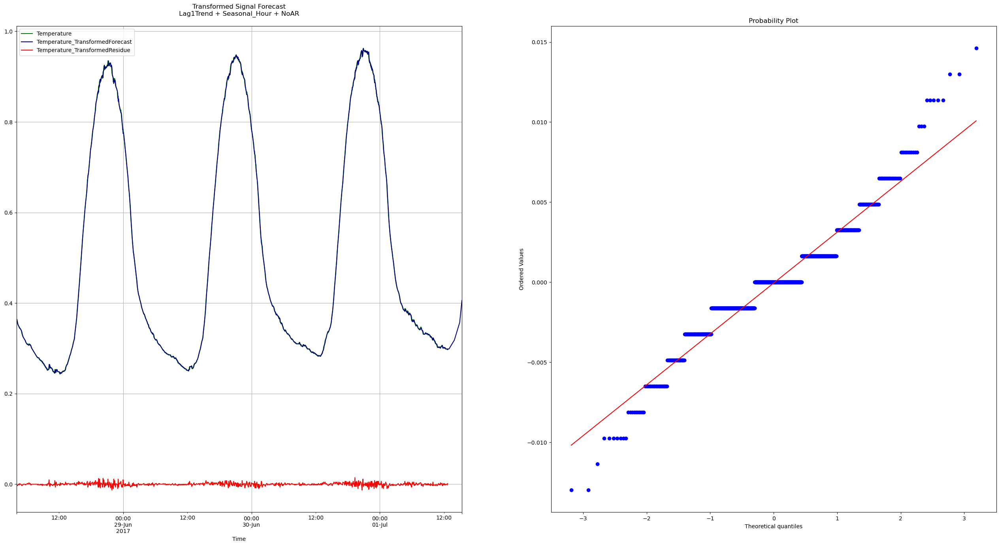

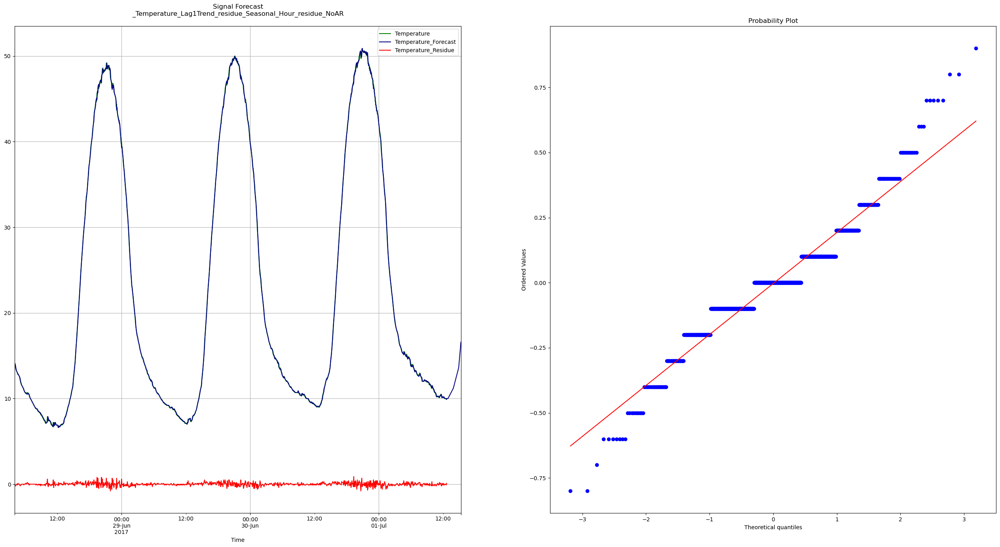

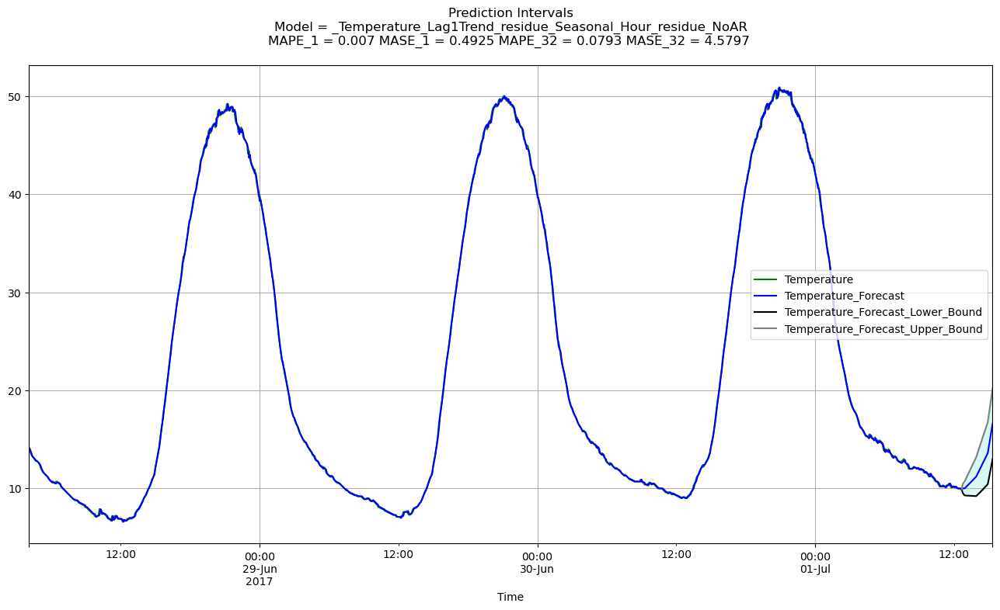

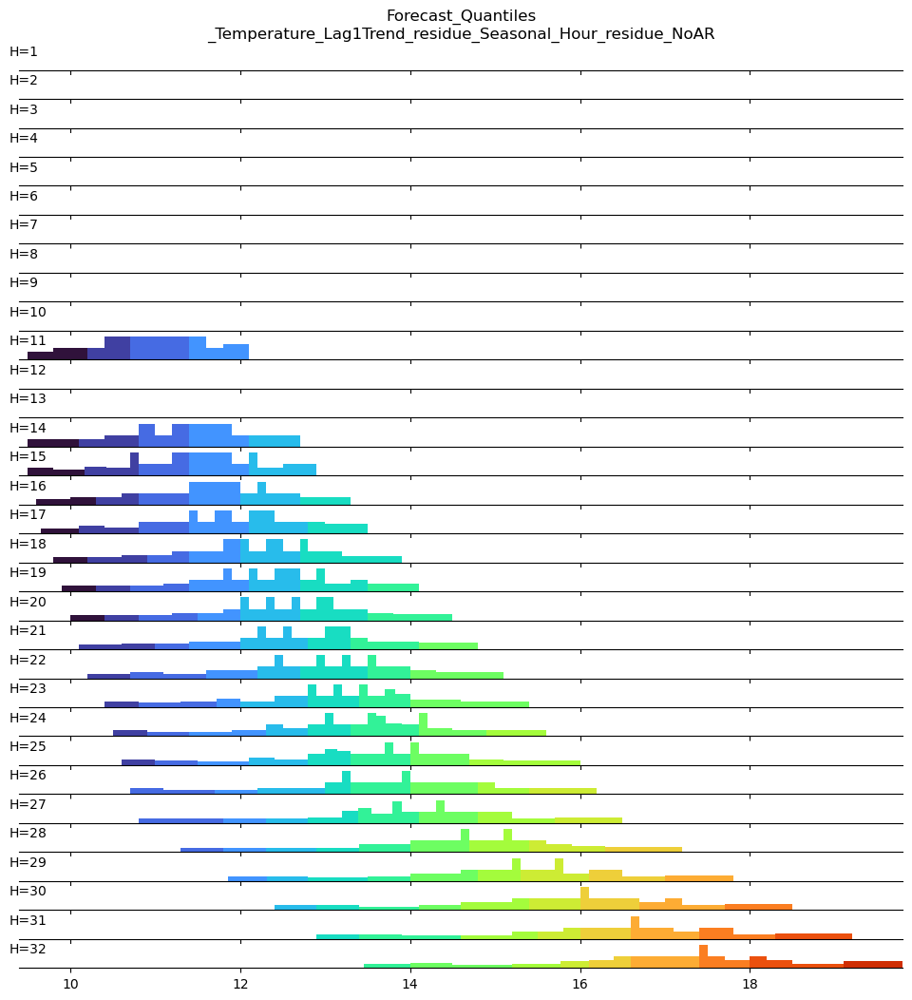

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 32}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 32,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4994,
 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.615, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 32}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

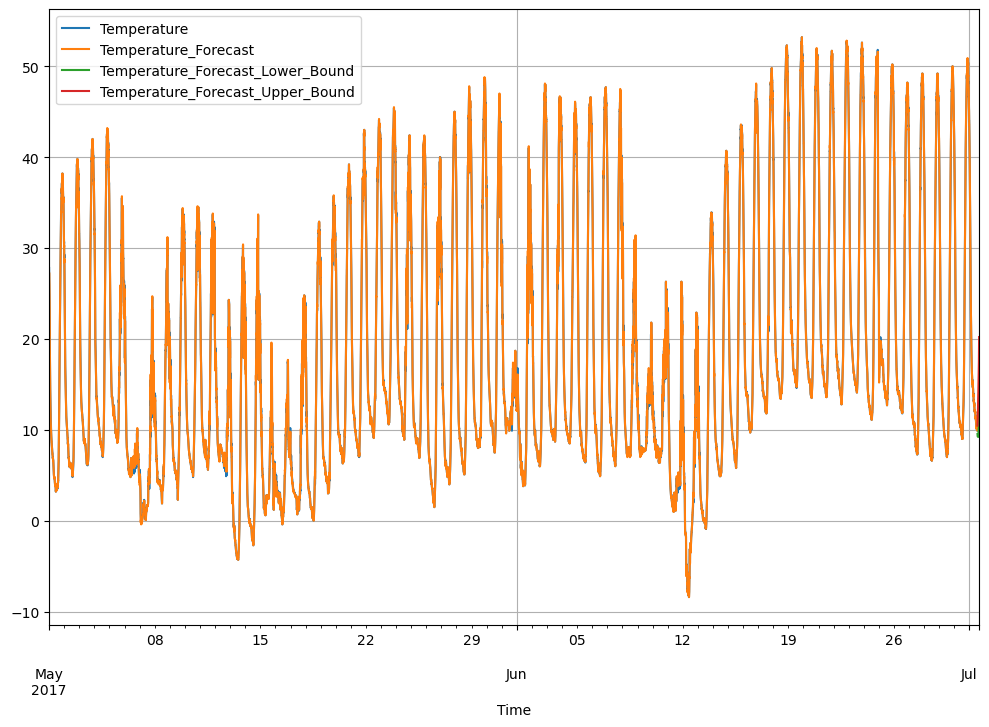

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 64}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17753 entries, 0 to 17752
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17753 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17753 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  32 non-null     float64       
 4   Temperature_Forecast_Upper_Bound  32 non-null     float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 693.6 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 13.446, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 14.039, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 64, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
IN

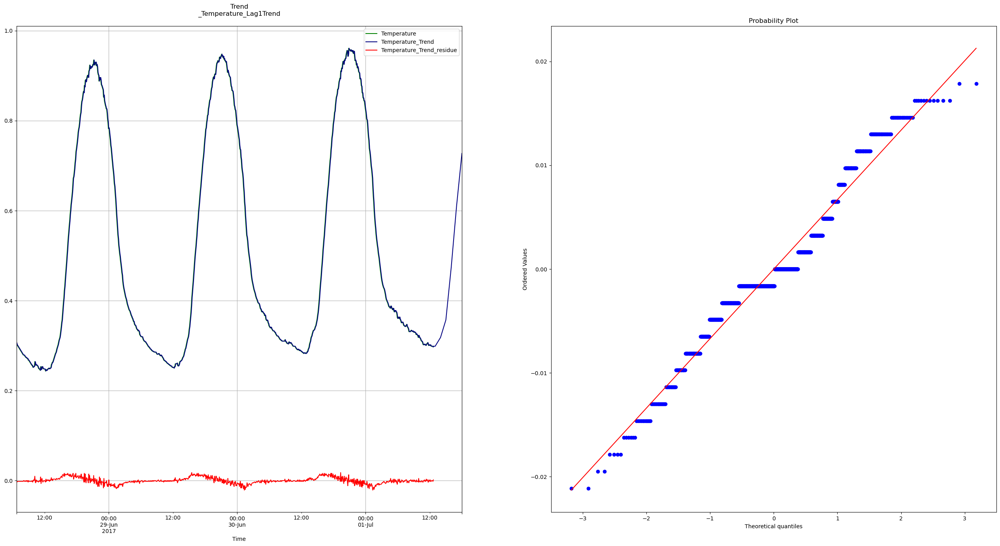

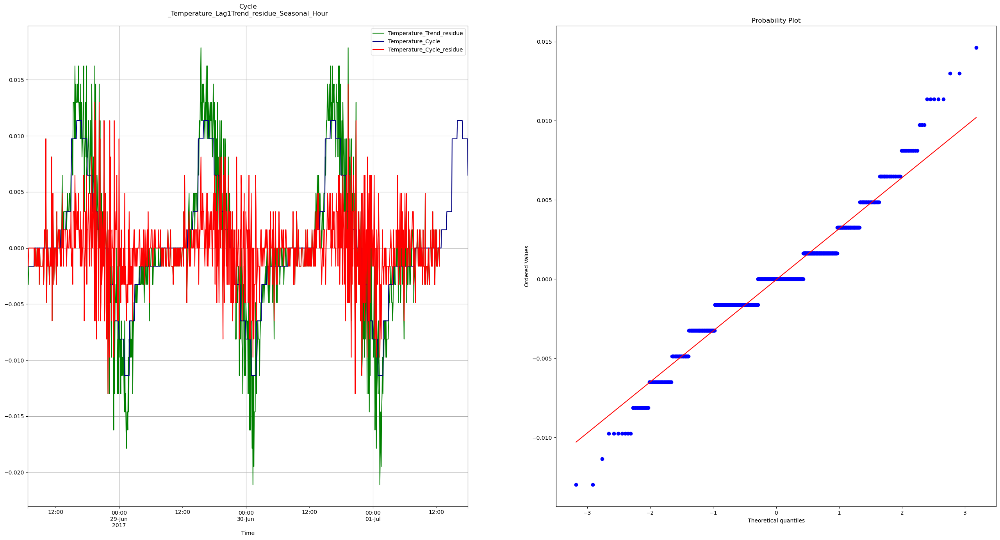

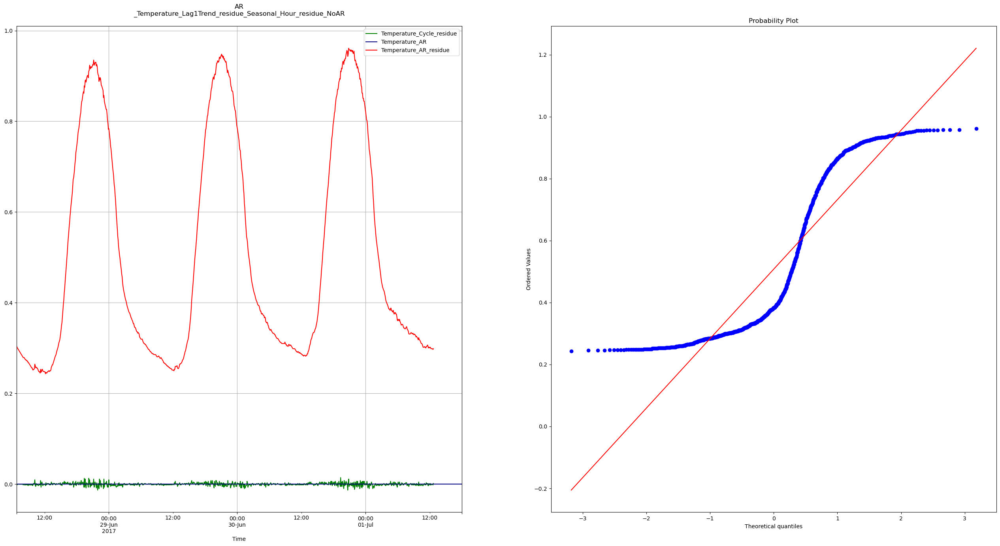

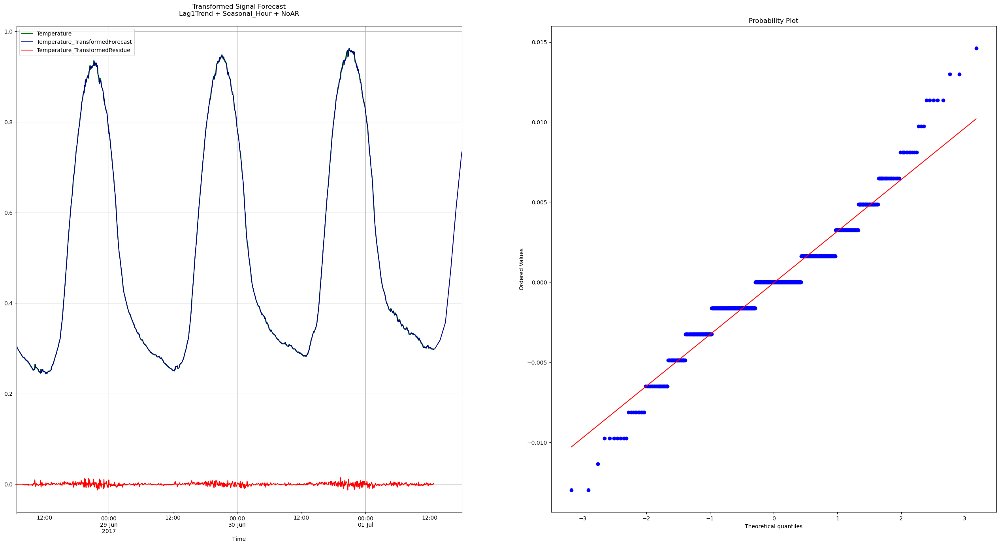

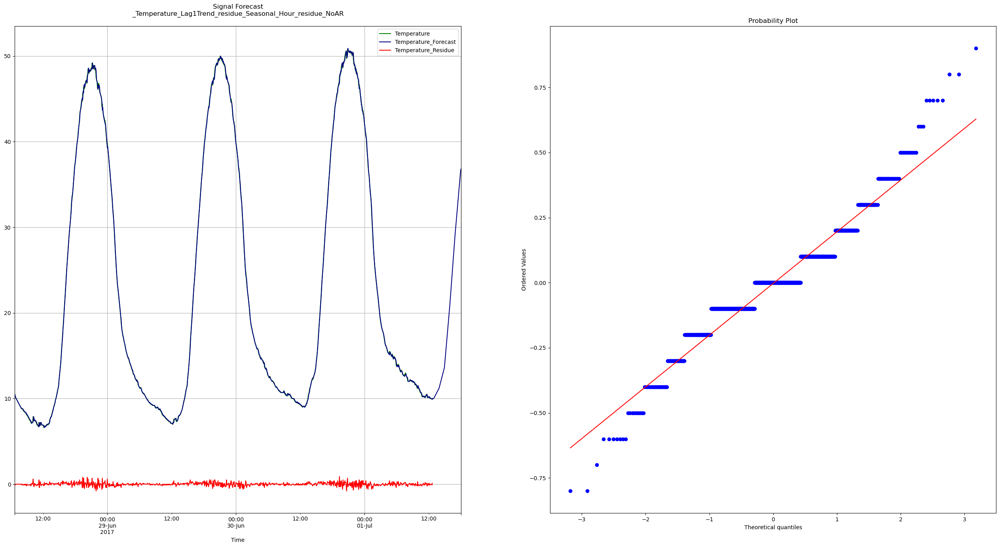

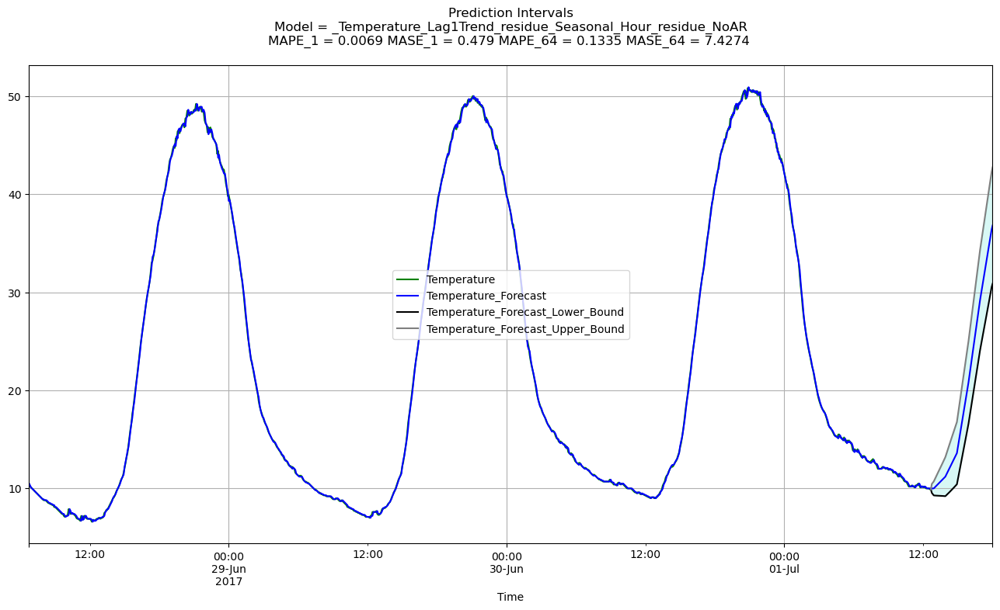

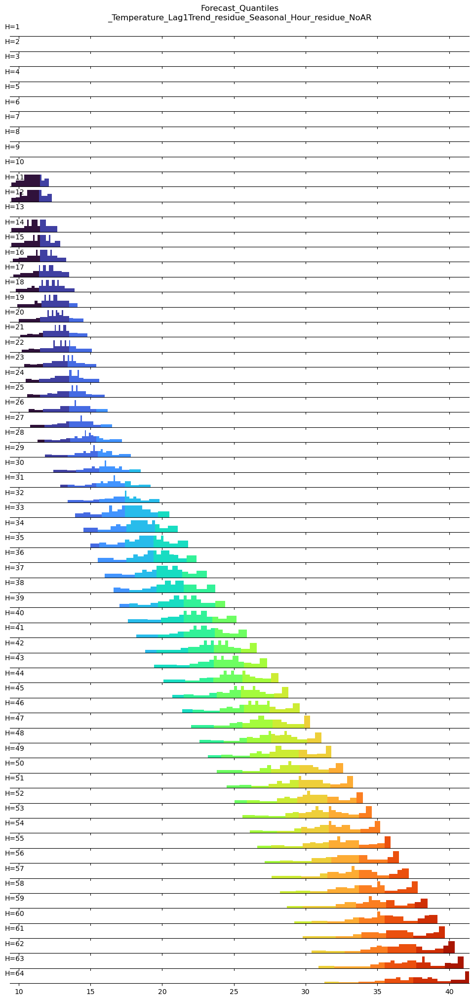

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 64}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 64,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4995,
 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.128, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 64}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

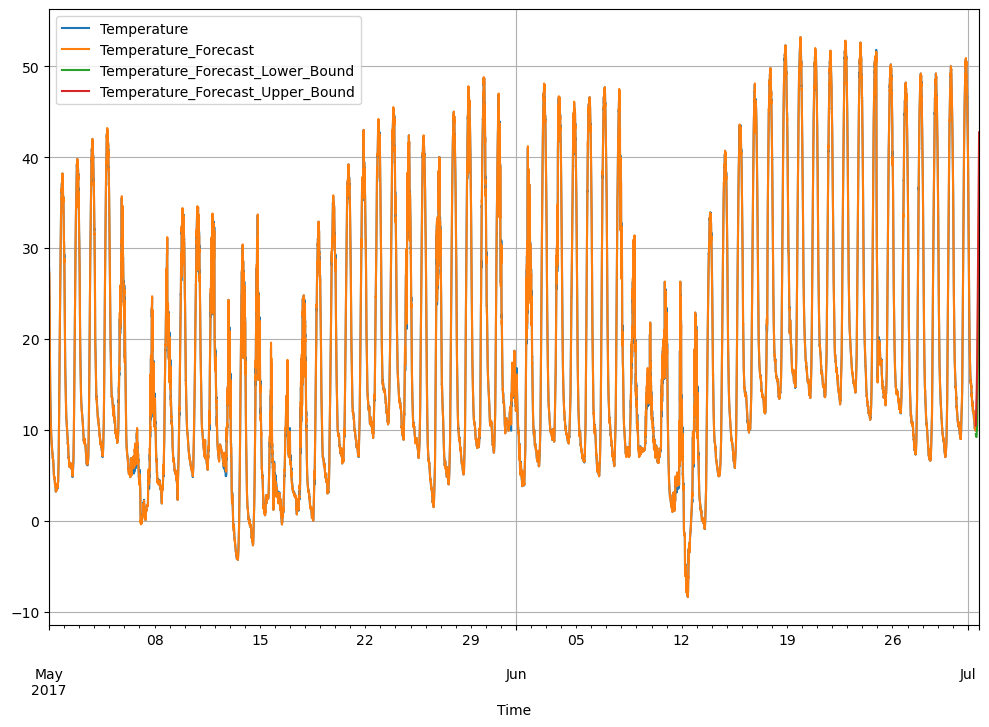

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 128}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17785 entries, 0 to 17784
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17785 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17785 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  64 non-null     float64       
 4   Temperature_Forecast_Upper_Bound  64 non-null     float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 694.9 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 24.289, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 24.842, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 128, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'

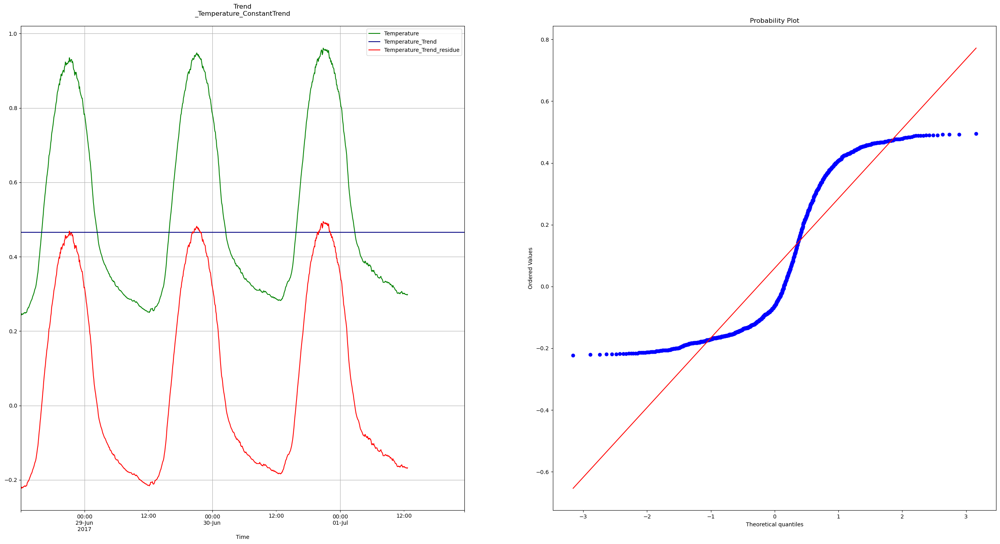

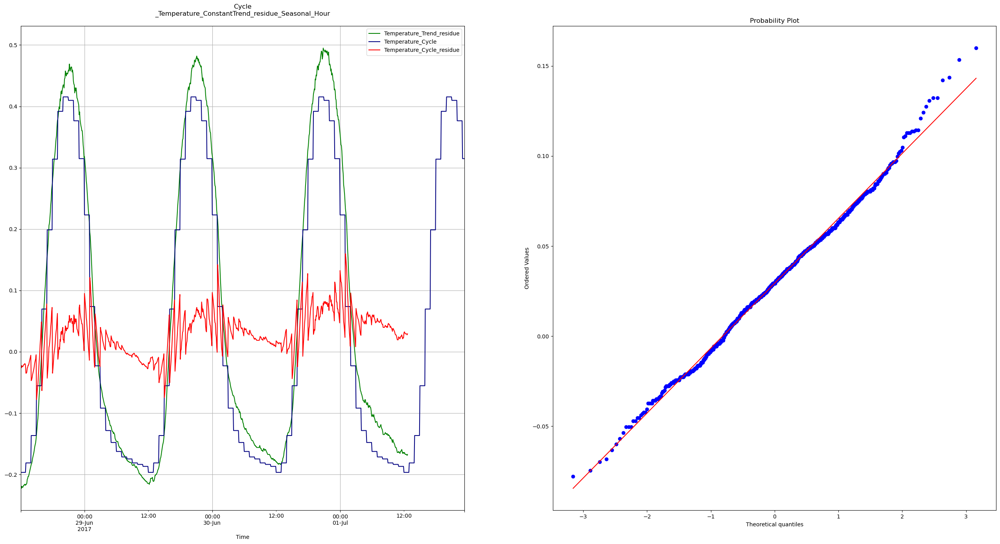

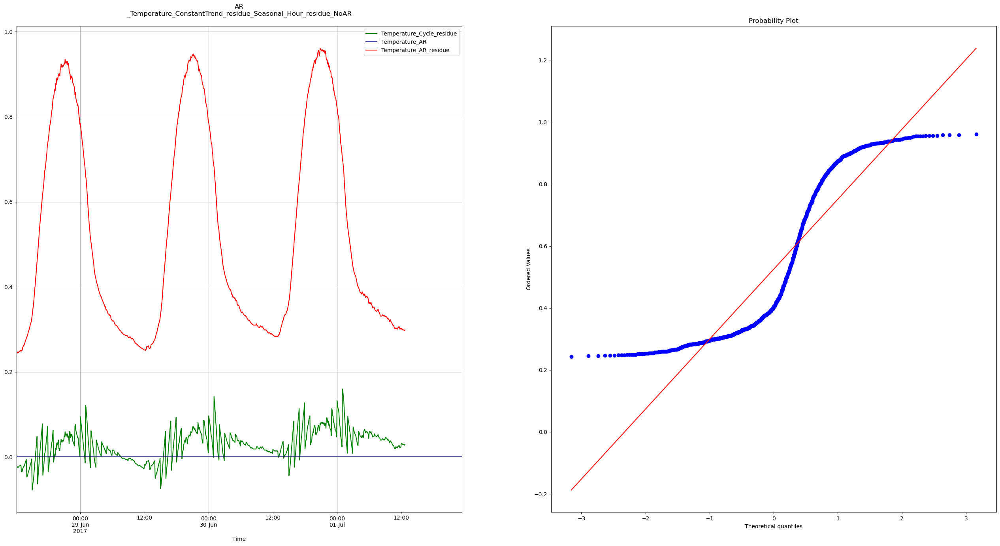

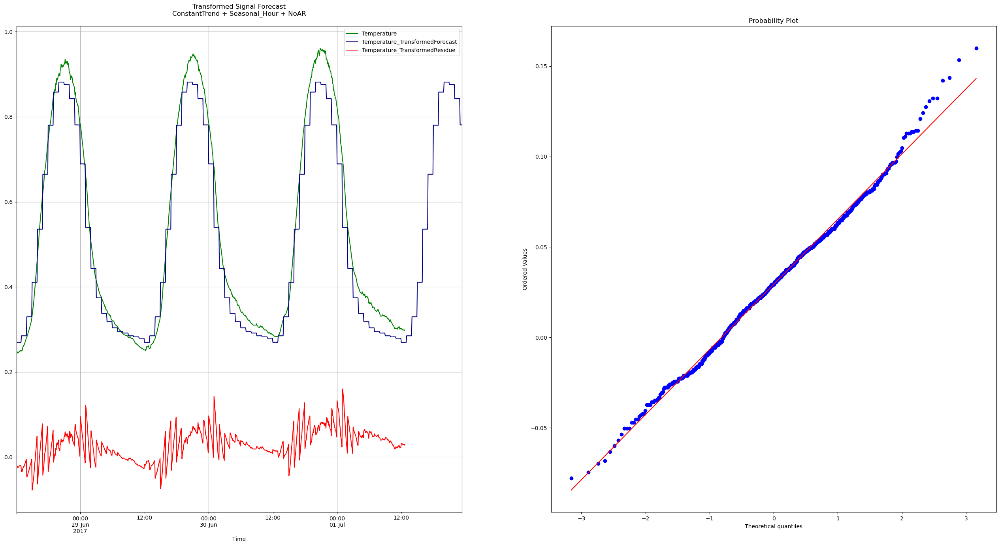

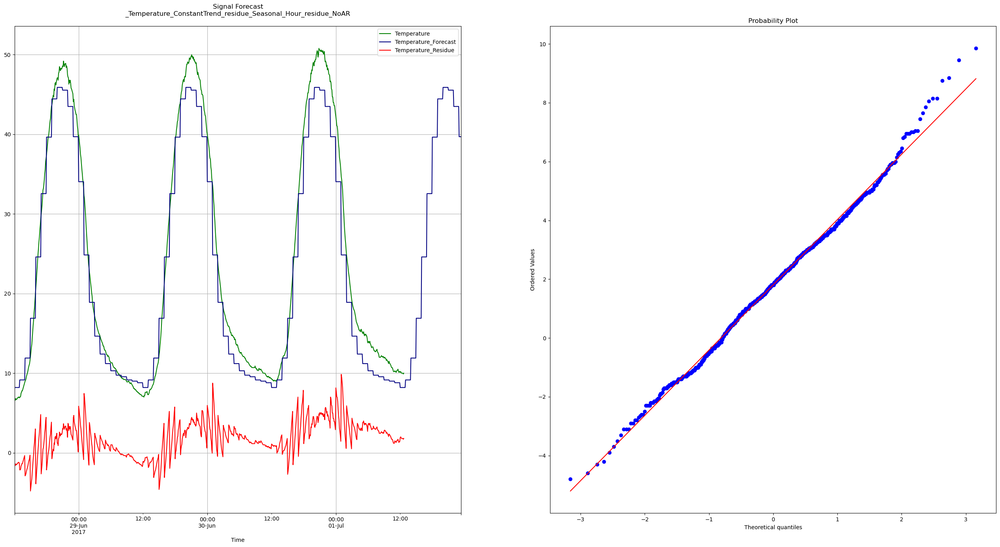

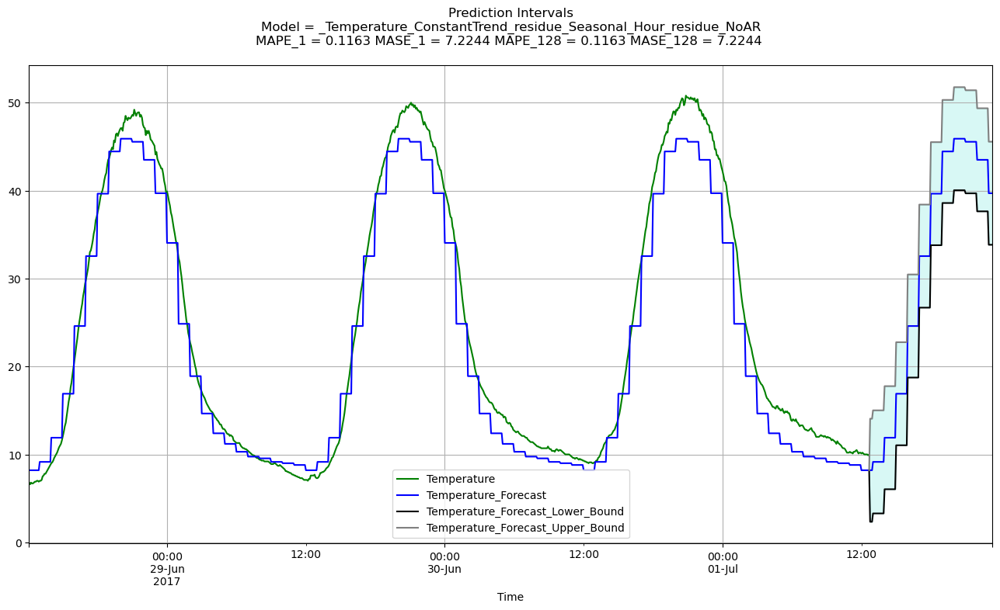

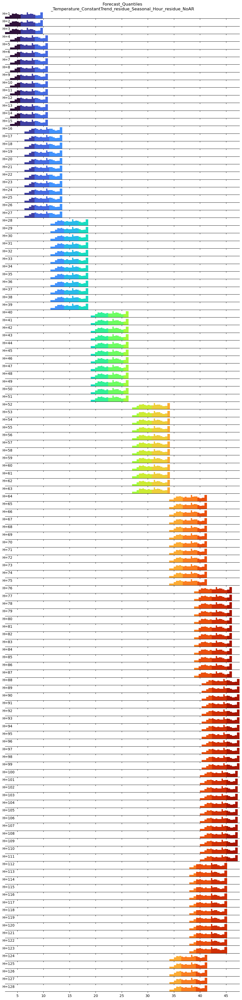

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 128}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 128,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.323, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 128}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

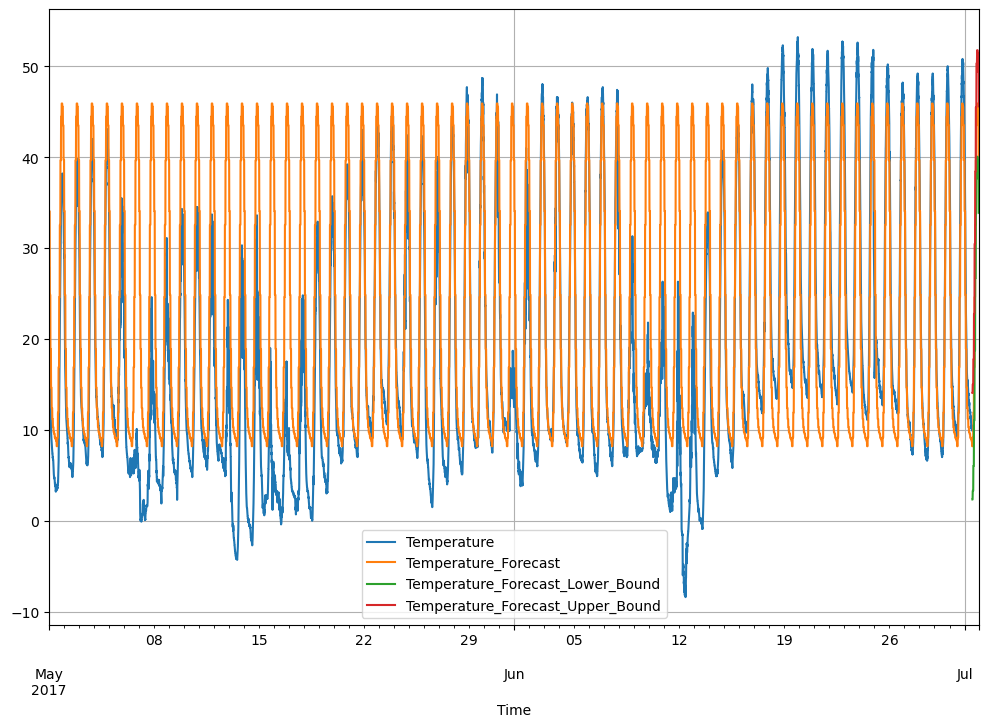

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 256}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17849 entries, 0 to 17848
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17849 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17849 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  128 non-null    float64       
 4   Temperature_Forecast_Upper_Bound  128 non-null    float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 697.4 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  8.20   
17722 2017-07-01 12:50:00          NaN                  8.20   
17723 2017-07-01 12:55:00          NaN                  8.20   
17724 2017-07-01 13:00:00          NaN                  9.15   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 46.983, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 47.434, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 256, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'

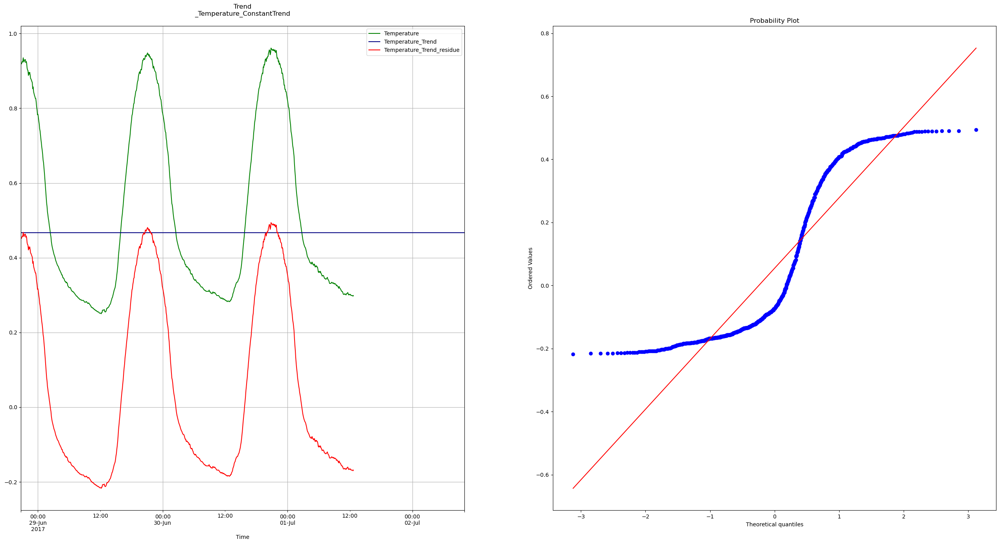

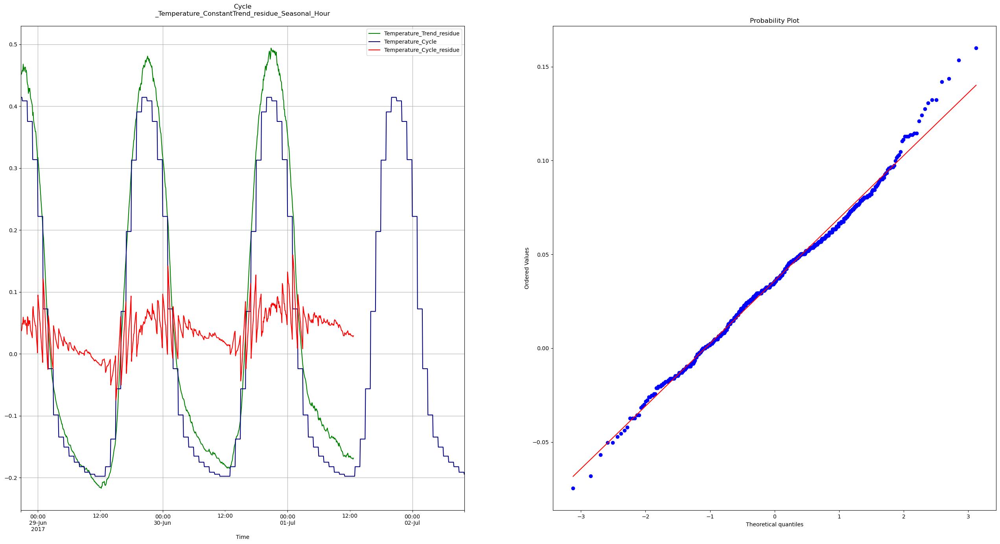

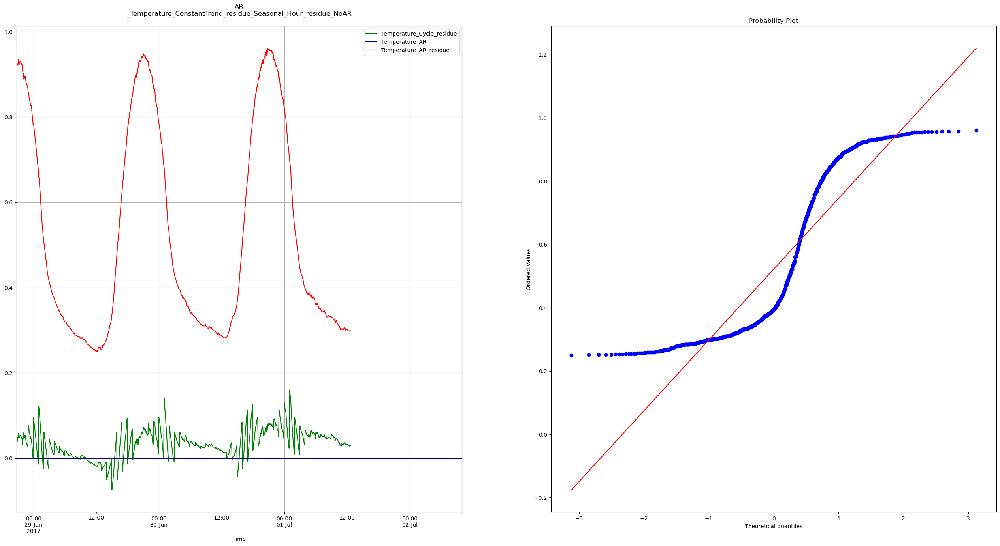

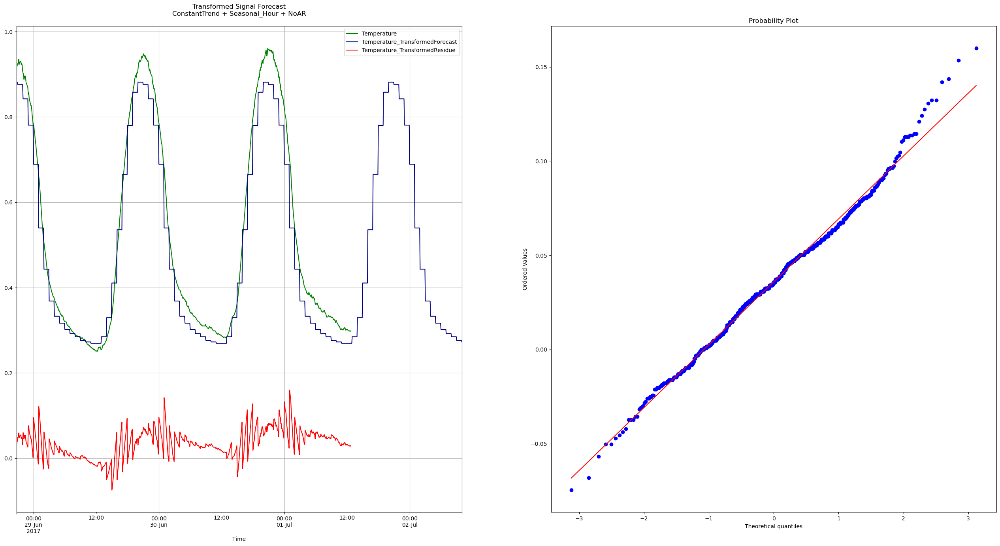

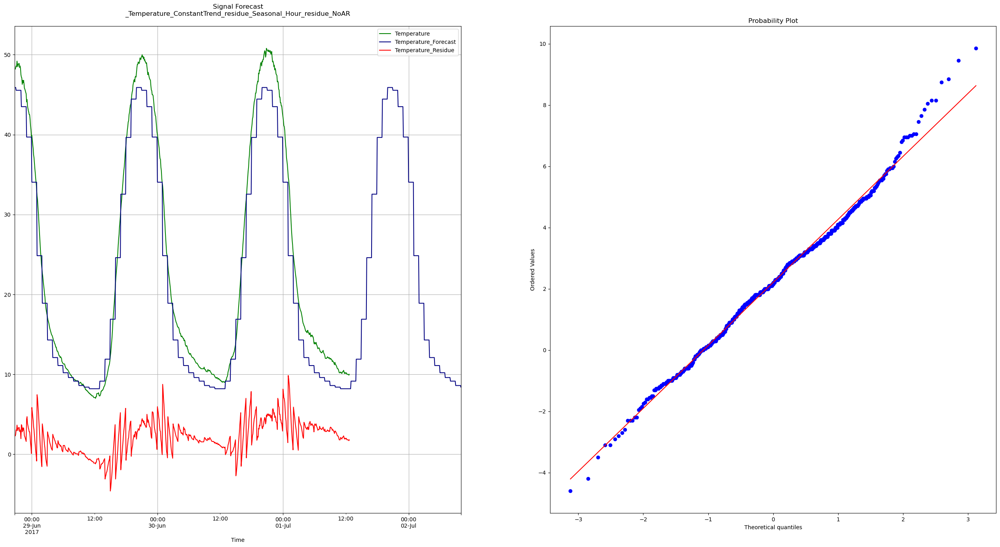

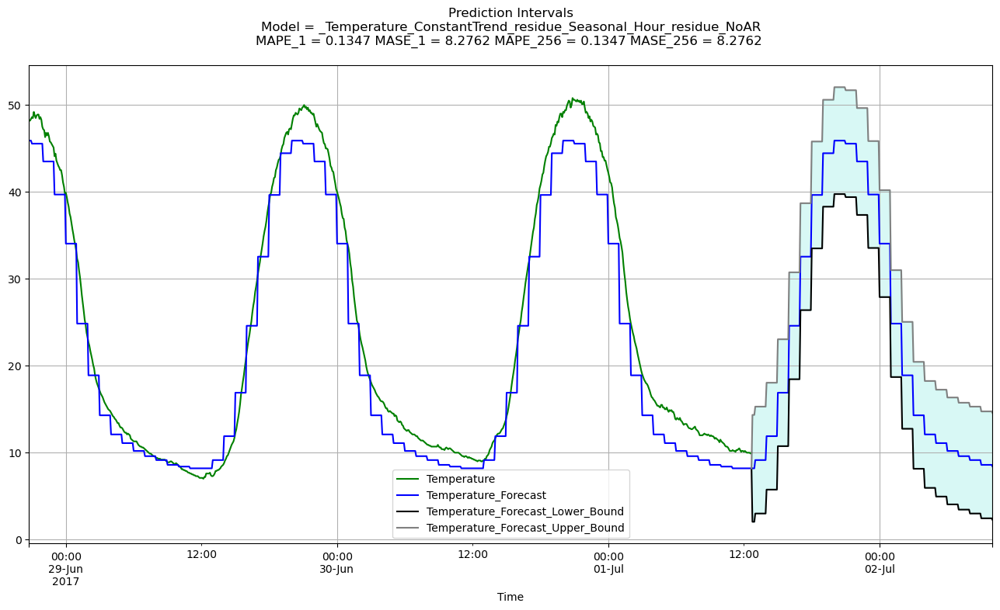

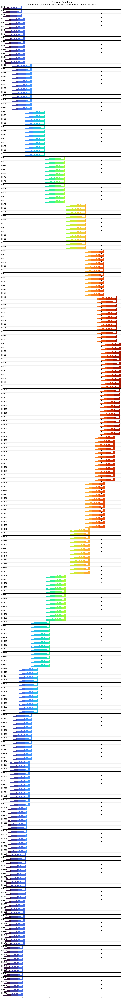

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 256}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 256,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 4.644, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 256}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

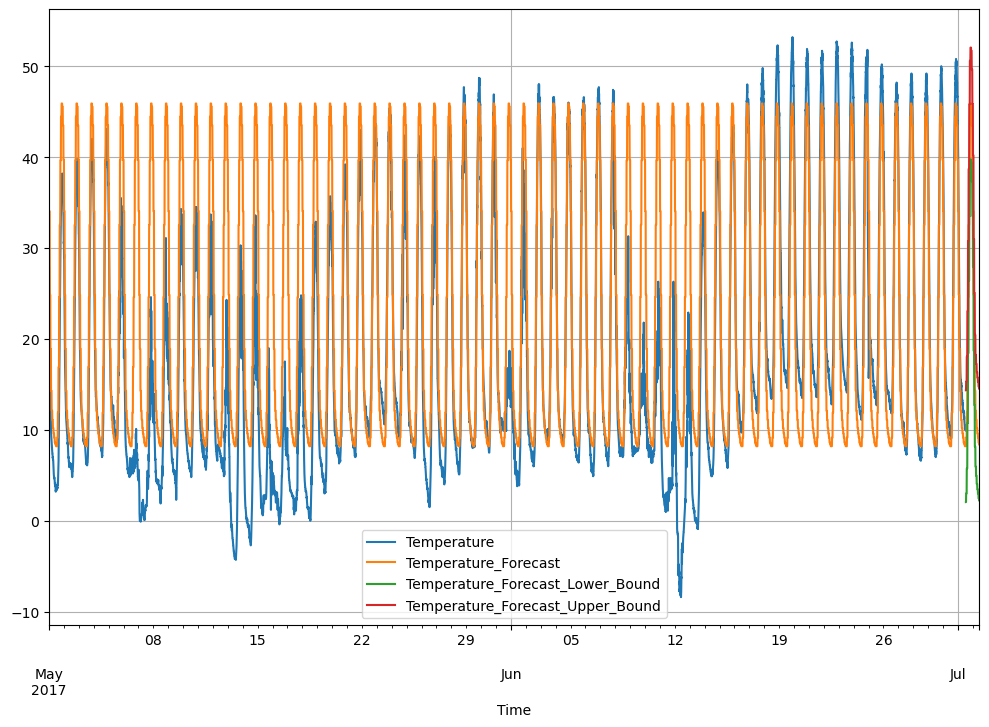

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 512}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17977 entries, 0 to 17976
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              17977 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              17977 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  256 non-null    float64       
 4   Temperature_Forecast_Upper_Bound  256 non-null    float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 702.4 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  8.20   
17722 2017-07-01 12:50:00          NaN                  8.20   
17723 2017-07-01 12:55:00          NaN                  8.20   
17724 2017-07-01 13:00:00          NaN                  9.15   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 92.415, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 94.843, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 512, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'

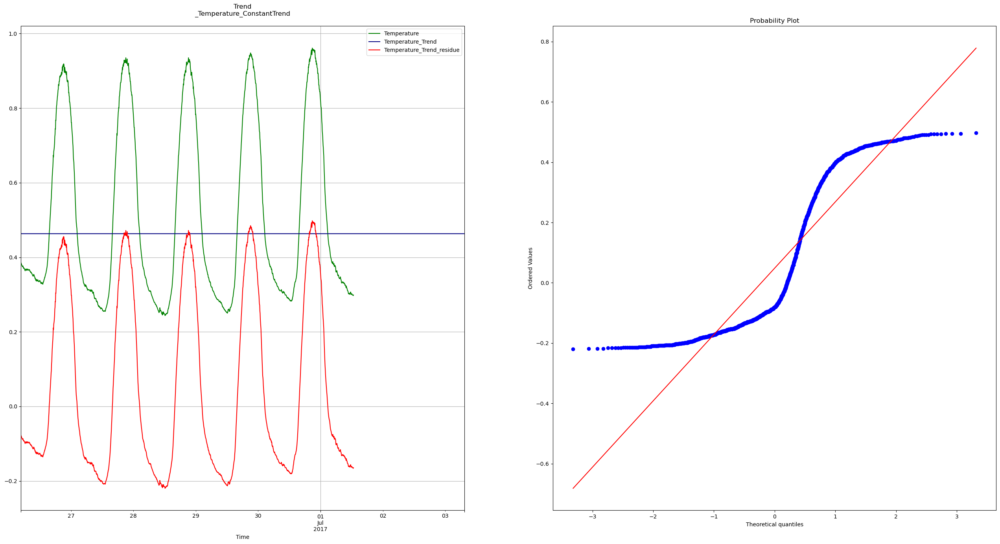

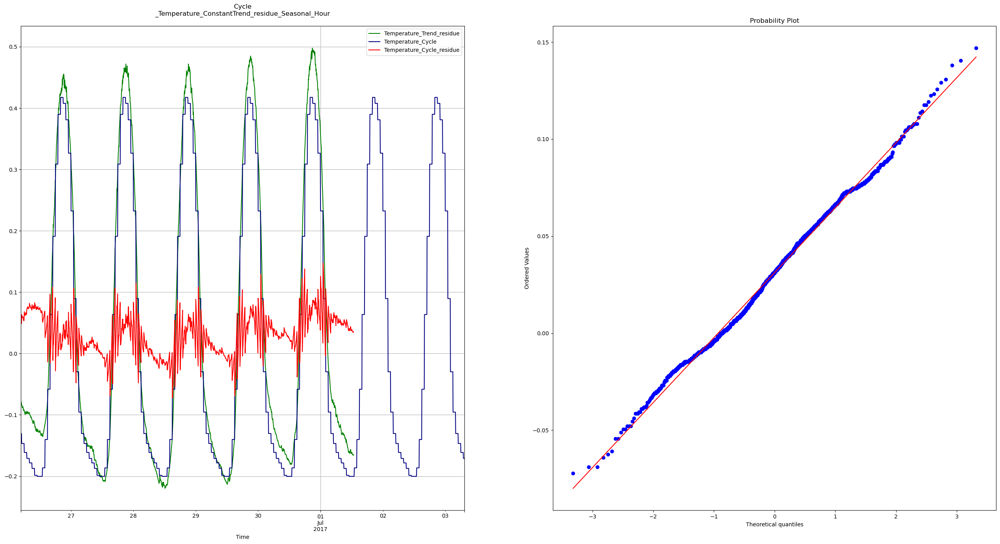

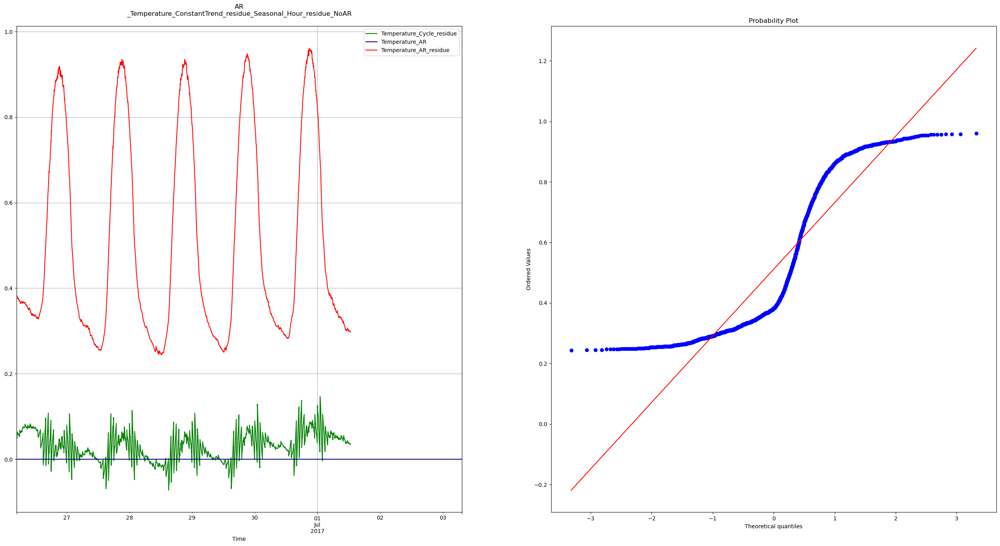

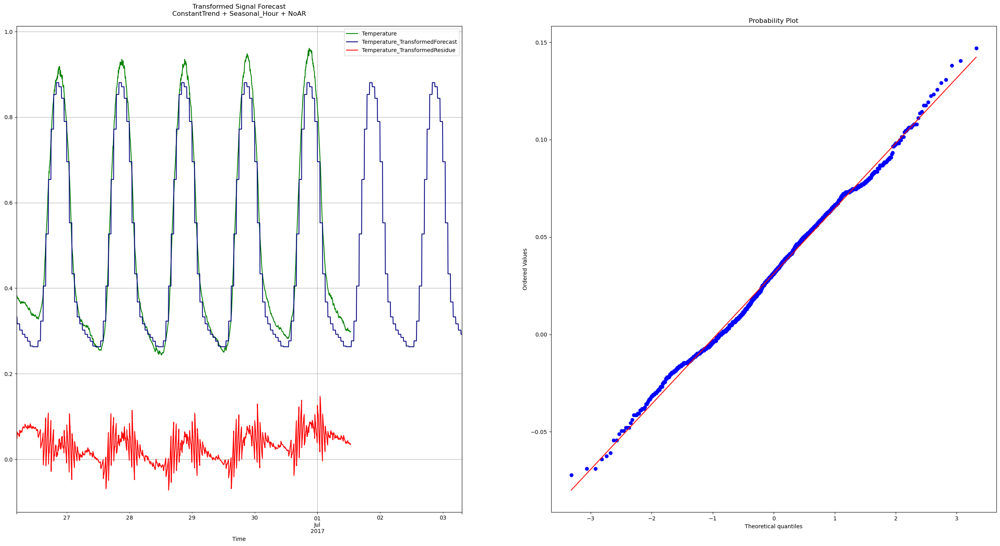

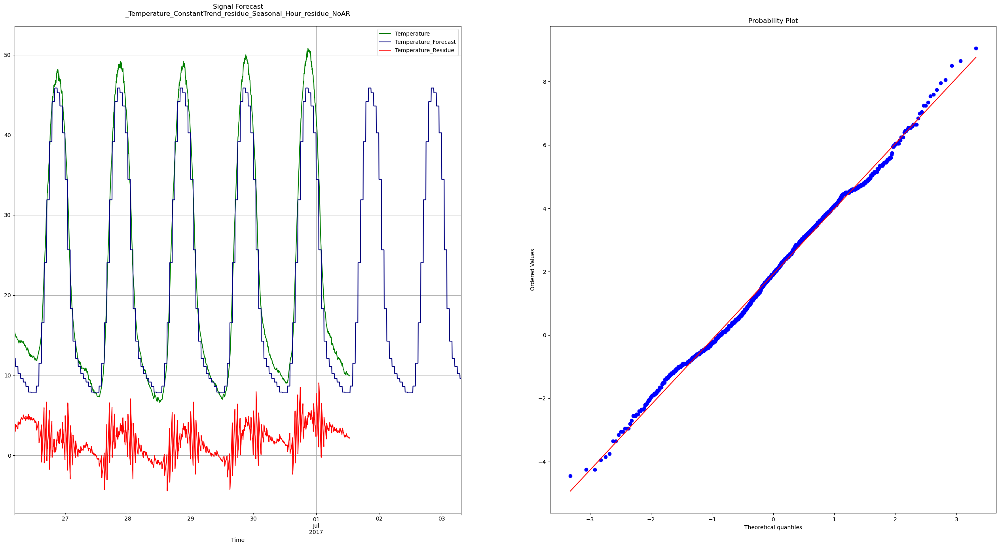

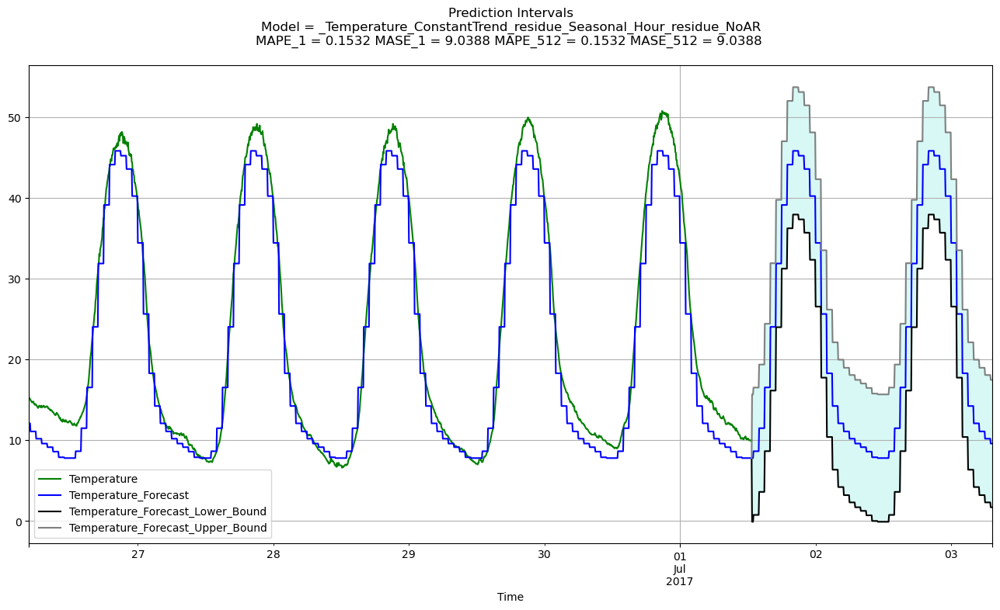

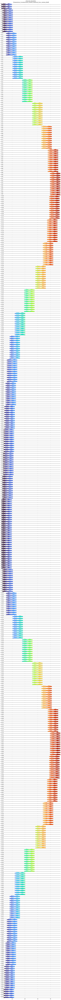

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 512}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 512,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 8.483, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 512}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

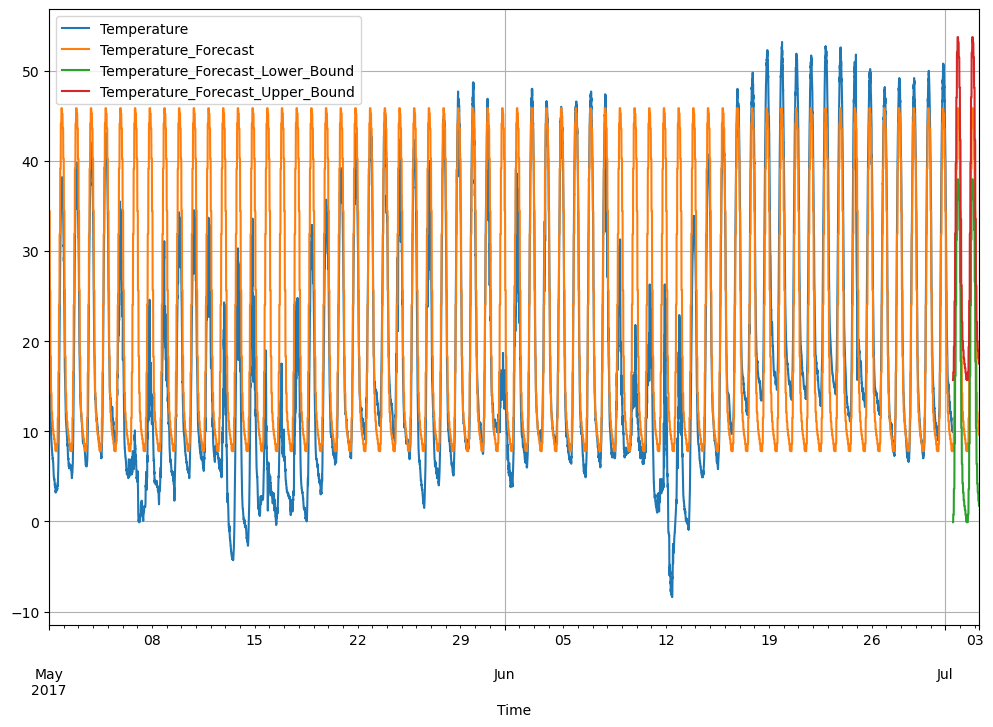

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 1024}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18233 entries, 0 to 18232
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              18233 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              18233 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  512 non-null    float64       
 4   Temperature_Forecast_Upper_Bound  512 non-null    float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 712.4 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  7.80   
17722 2017-07-01 12:50:00          NaN                  7.80   
17723 2017-07-01 12:55:00          NaN                  7.80   
17724 2017-07-01 13:00:00          NaN                  8.65   
17725

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 176.334, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 185.445, ('TRAINING', {'Signal': 'Temperature', 'Horizon': 1024, 'Transformation': 'RelDiff_Temperature', 'DecompositionType':

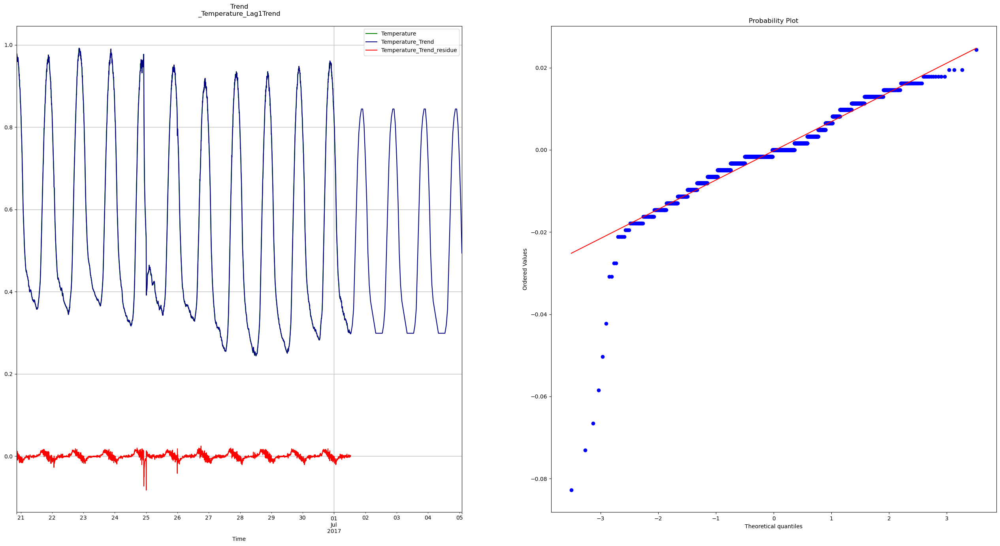

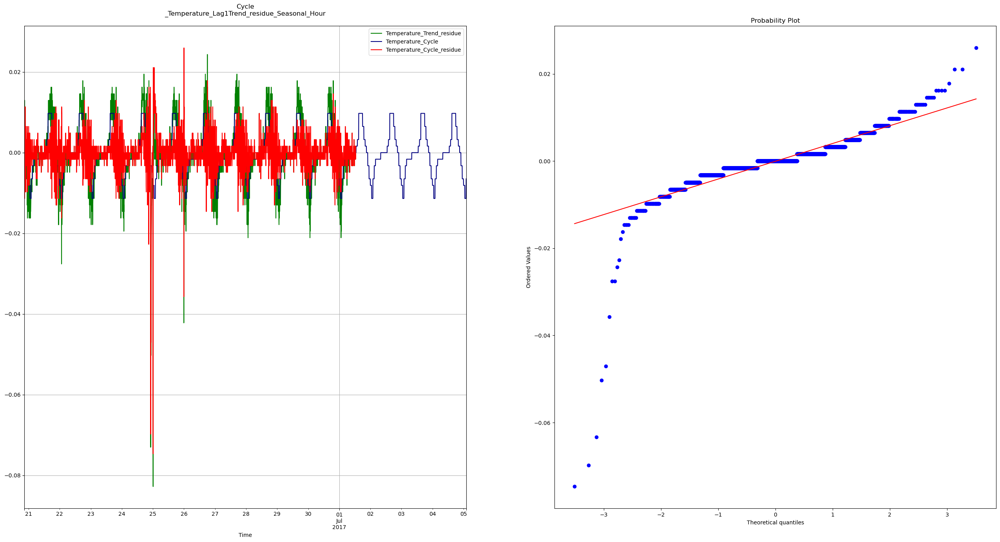

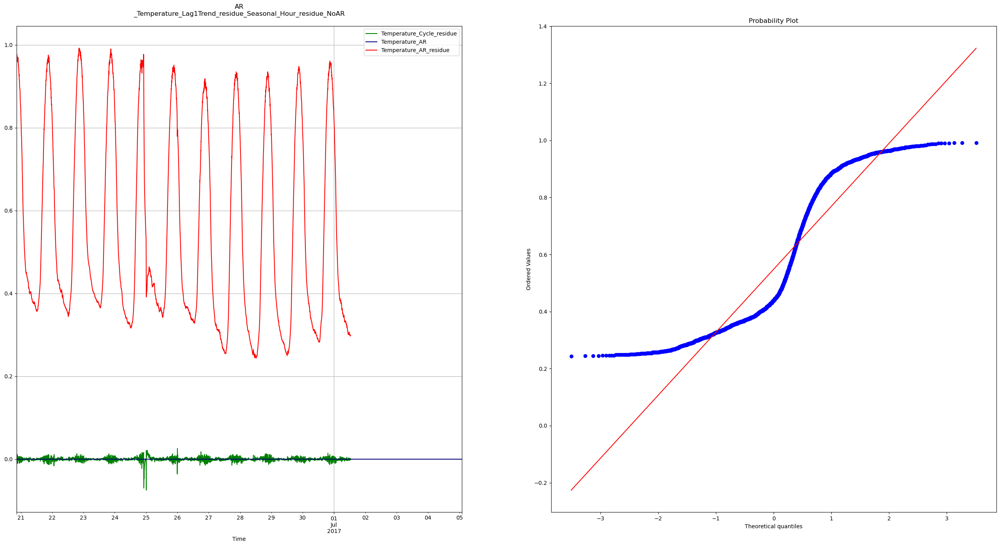

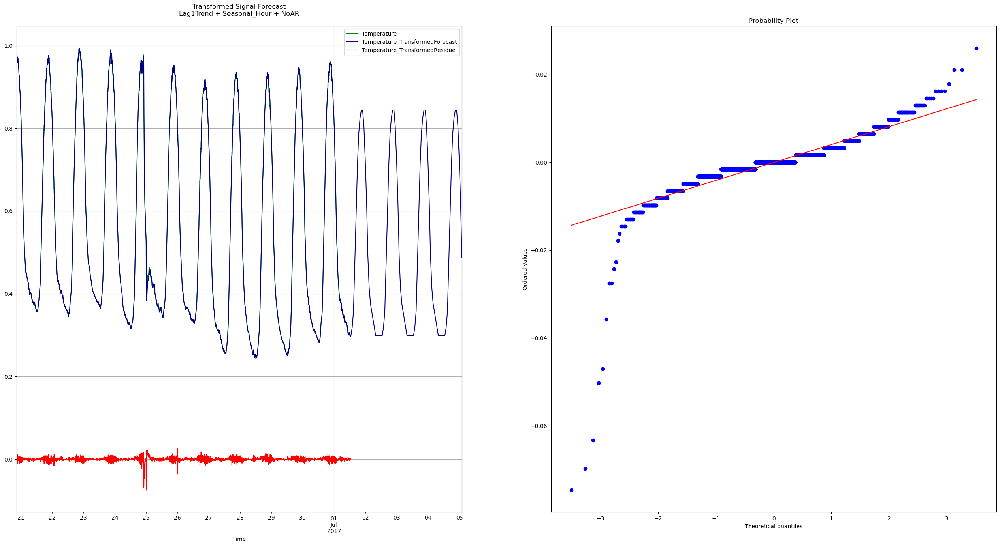

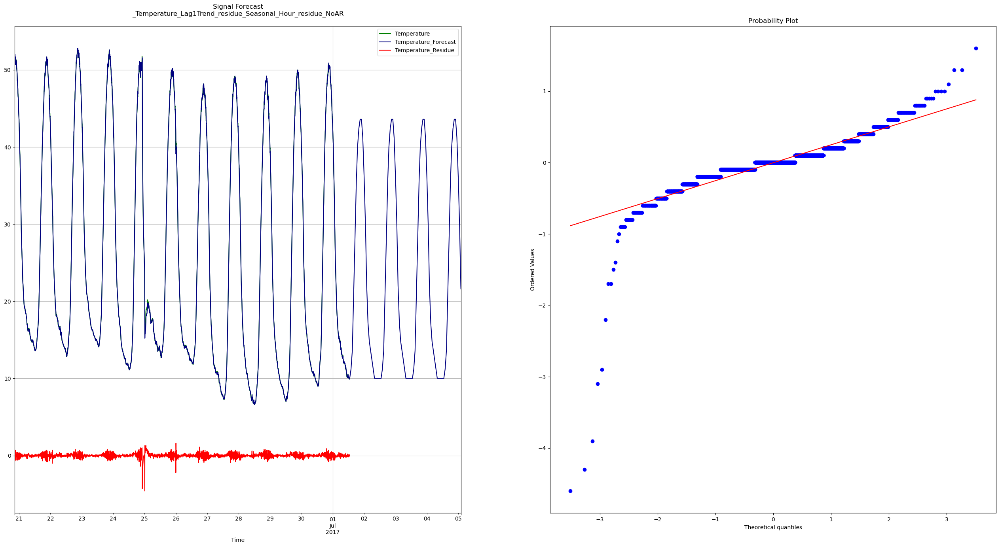

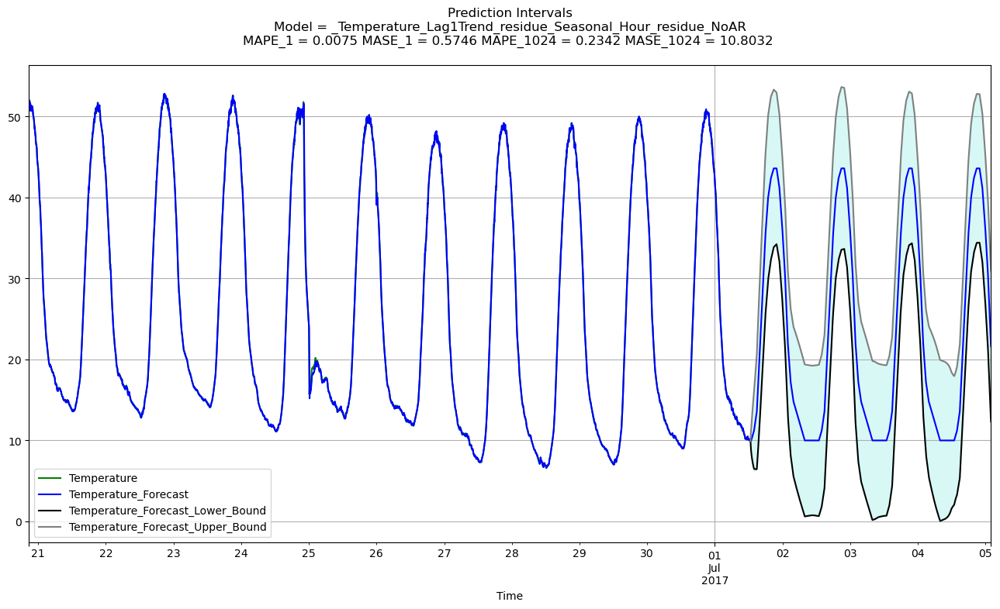

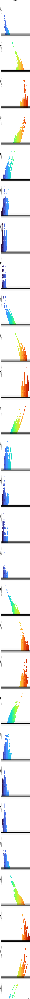

INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 1024}))




<ModelInfo>
{
    "Temperature": {
        "Complexity": {
            "AR": "S",
            "Cycle": "S",
            "Decomposition": "S",
            "Transformation": "S",
            "Trend": "S"
        },
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 1024,
                "TimeDelta": "<DateOffset: minutes=5>",
                "TimeMax": "2017-07-01 12:40:00",
                "TimeMin": "2017-06-03 02:05:00",
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "1": {
                "AUC": 0.4995,

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 16.688, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 1024}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

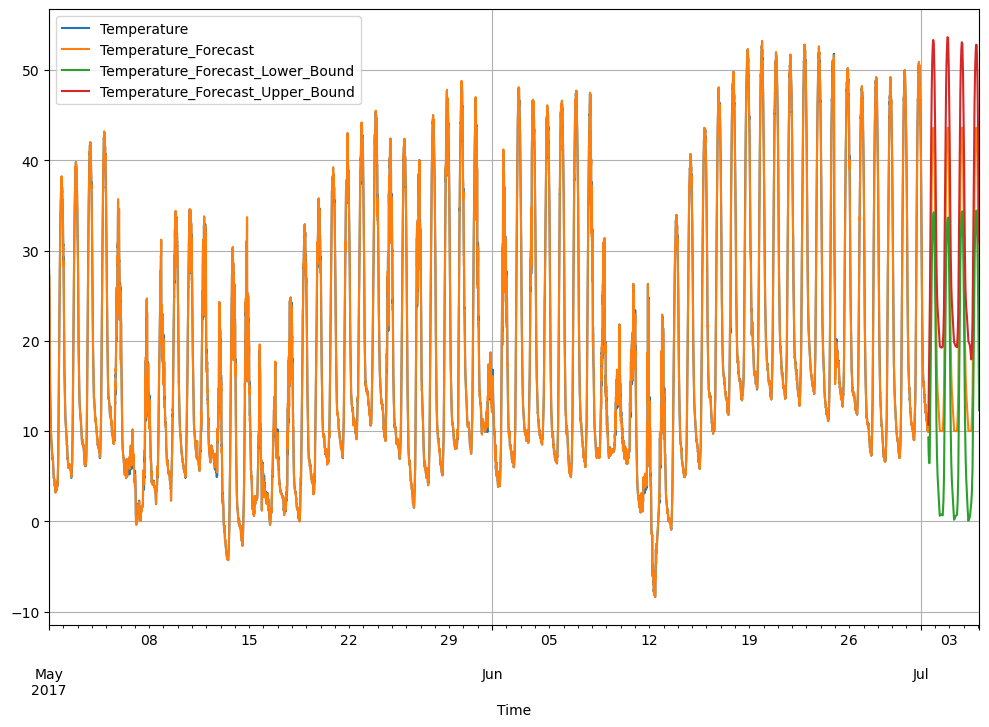

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18745 entries, 0 to 18744
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Time                              18745 non-null  datetime64[ns]
 1   Temperature                       17721 non-null  float64       
 2   Temperature_Forecast              18745 non-null  float64       
 3   Temperature_Forecast_Lower_Bound  1024 non-null   float64       
 4   Temperature_Forecast_Upper_Bound  1024 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 732.4 KB
None
Forecasts
                      Time  Temperature  Temperature_Forecast  \
17721 2017-07-01 12:45:00          NaN                  10.0   
17722 2017-07-01 12:50:00          NaN                  10.0   
17723 2017-07-01 12:55:00          NaN                  10.0   
17724 2017-07-01 13:00:00          NaN                  10.1   
17725

In [6]:
lEngines = {}
for H in [2**x for x in range(2, 11)]:
    lEngines[H] = build_forecast_and_plot_model(H)
